# Correlation #

Correlation between any two features is visualized with five heatmaps below, and the features contained in each heatmap have the similar fashion as in the EDA above. The correlation achieves two purposes for building machine learning models further:

First, we can examine how the label, Current Teacher, and a feature is linearly related at a glance. This helps determining features to be included in ML models - feature selection. 

Second, we can discover collinearity between any two features by exploring the heatmaps so that we could possibly compare or remove duplicated features. 

The features are processed as below for the correlation and heatmap:
- The names of features are updated following Dr. Feng’s naming convention. 
- All binomial features are *get_dummies()* and left with the response value corresponding to the feature name. e.g.) gender_T_Female=1 means Teacher’s gender is female.
- Nominal features are *get_dummies()* and processed as these two types:
  - treated as one vs. all. e.g.) BA_major_code_STEM=1 means Teacher’s BA major is STEM; BA_major_code_STEM=0 means it is one of other majors.
  - treated as a binomial. e.g.) region_West means School is located in West.
-All numerical and ordinal features, including Likert scale categories,  are not *get_dummies()*. 

**Heatmap List**
1. Public Teacher #1: General, Demographic information 
1. Public Teacher #2: Education and Training 
1. Public Teacher #3: Teaching Experience
1. Public School: General information, Poverty Proxy
1. Public Principal and Public District (available from Public School)
  - Principals Demographic information, Teaching and Training 
  - District Incentive Policy

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings 
warnings.filterwarnings("ignore")

In [2]:
df=pd.read_csv('../../data/data_clean/SASS_99_00_T2_T3_S4A_S3A_S2A.csv', sep=',', header=0)
df.shape

(3640, 128)

### Public Teacher #1 ###
- Features: `region`, `marital_status`, `race_t`, `gender_t`, `summer_teaching`, `nonteaching_job`, `nonschool_job`, `extracur_act`, `merit_pay`, `outside_pay`, `union_member`, `age_t`, `total_yearly_earnings`, `school_related_earnings`, `base_salary_amt`, `number_of_dependents`, `dependents_under_age_5`

In [3]:
cols=['CNTLNUM_T', 'SCHCNTL', 'CNTLNUM_P', 'label', 'REGION', 'F0195', 'RACETH_T', 'GENDER', 'T0341', 'T0343', 'T0345', 'T0348', 'T0350', 'T0352', 'T0355', 'AGE_T', 'EARNALL', 'EARNSCH', 'T0347', 'F0196', 'F0197']
cols_new=['CNTLNUM_T', 'SCHCNTL', 'CNTLNUM_P', 'label_Current_Teacher', 'region', 'marital_status', 'race_t', 'gender_t', 'summer_teaching', 'nonteaching_job', 'nonschool_job', 'extracur_act', 'merit_pay', 'outside_pay', 'union_member', 'age_t', 'total_yearly_earnings', 'school_related_earnings', 'base_salary_amt', 'number_of_dependents', 'dependents_under_age_5']
cols_dummies=['region', 'marital_status', 'race_t', 'gender_t', 'summer_teaching', 'nonteaching_job', 'nonschool_job', 'extracur_act', 'merit_pay', 'outside_pay', 'union_member']
cols_drop=['marital_status_2', 'marital_status_3', 'gender_t_1', 'summer_teaching_2', 'nonteaching_job_2', 'nonschool_job_2', 'extracur_act_2', 'merit_pay_2', 'outside_pay_2', 'union_member_2']
names={'marital_status_1': 'marital_status_Married', 'race_t_1': 'race_t_AIAN', 'race_t_2': 'race_t_Asian', 'race_t_3': 'race_t_Black', 'race_t_4': 'race_t_White', 'race_t_5': 'race_t_Hispanic', 'gender_t_2': 'gender_t_Female', 'summer_teaching_1': 'summer_teaching_Yes', 'nonteaching_job_1': 'nonteaching_job_Yes', 'nonschool_job_1': 'nonschool_job_Yes', 'extracur_act_1': 'extracur_act_Yes', 'merit_pay_1': 'merit_pay_Yes', 'outside_pay_1': 'outside_pay_Yes', 'union_member_1': 'union_member_Yes'}

In [4]:
ren=dict(zip(cols, cols_new))
df_r_t1=df[cols].copy()
df_r_t1.rename(columns=ren, inplace=True)

In [5]:
keys=np.sort(df_r_t1.region.unique())
values=['Northeast', 'Midwest', 'South', 'West']
ren=dict(zip(keys, values))
df_r_t1.region=df_r_t1.region.map(ren)

In [6]:
df_r_t1=pd.get_dummies(df_r_t1, columns=cols_dummies, prefix=cols_dummies)
print([ index+', '+str(count) for index,count in zip(df_r_t1.isna().sum().index, df_r_t1.isna().sum()) if count != 0])

df_r_t1.drop(cols_drop, axis=1, inplace=True)
# df_r_t1.columns

df_r_t1.rename(columns=names, inplace=True)
print([ index+', '+str(count) for index,count in zip(df_r_t1.isna().sum().index, df_r_t1.isna().sum()) if count != 0])

[]
[]


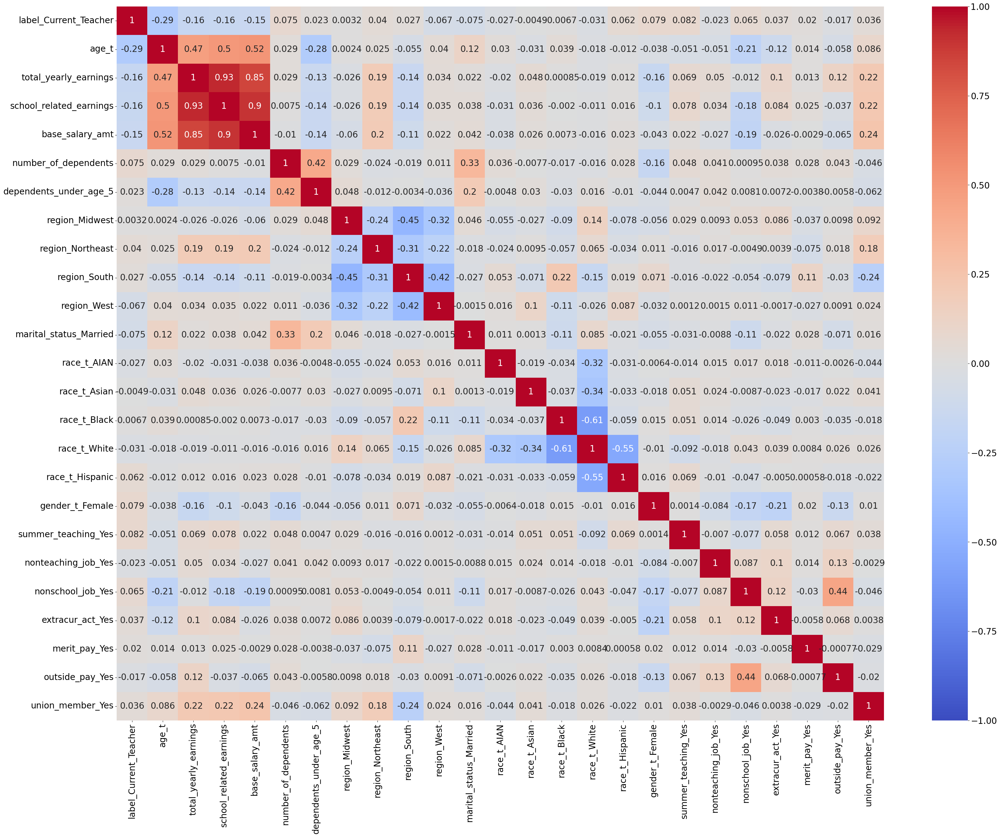

In [7]:
plt.rcParams['axes.titlesize']=18
plt.rcParams['axes.labelsize']=16
plt.rcParams['xtick.labelsize']=20
plt.rcParams['ytick.labelsize']=20

df_t1=df_r_t1.drop(['CNTLNUM_T', 'SCHCNTL', 'CNTLNUM_P'], axis=1).corr()
plt.figure(figsize=(40,30))
sns.heatmap(data=df_t1, annot=True, annot_kws={"size":20}, cmap='coolwarm', vmin=-1)
plt.show()

In [8]:
pd.DataFrame(df_t1['label_Current_Teacher'].nlargest(6).sort_values(ascending=False))

,label_Current_Teacher
label_Current_Teacher,1.000000
summer_teaching_Yes,0.082424
gender_t_Female,0.078965
number_of_dependents,0.075240
nonschool_job_Yes,0.065199
race_t_Hispanic,0.062211


In [9]:
pd.DataFrame(df_t1['label_Current_Teacher'].nsmallest(5))

,label_Current_Teacher
age_t,-0.294343
total_yearly_earnings,-0.162032
school_related_earnings,-0.155463
base_salary_amt,-0.146667
marital_status_Married,-0.074866


Public Teachers general and demographic information do not show strong correlations between the features and Current teacher status. `age` and Current teacher indicates slight negative correlation in which teachers age increases, Current teachers decreases.

### Public Teacher #2 ###
- Features: `main_tch_fields_cert_type`, `MA_deg`, `BA_major_code`, `MA_major_code`, `main_field_cert`, `BA_deg`, `AA_deg`, `BA2_deg`, `MA2_deg`, `EdS_deg`, `Grad_cert`, `Phd_deg`, `pd_release_t`, `pd_schedule_t`, `pd_stipend`, `pd_tuition_r`, `pd_conference_r`, `pd_travel_r`, `MA_grad_yr`

In [10]:
cols=['CNTLNUM_T', 'SCHCNTL', 'CNTLNUM_P', 'label', 'T0104', 'T0080', 'T0072', 'T0081', 'T0103', 'T0070', 'T0084', 'T0087', 'T0090', 'T0093', 'T0096', 'T0099', 'T0179', 'T0180', 'T0181', 'T0182', 'T0183', 'T0184', 'T0082']
cols_new=['CNTLNUM_T', 'SCHCNTL', 'CNTLNUM_P', 'label_Current_Teacher', 'main_tch_fields_cert_type', 'MA_deg', 'BA_major_code', 'MA_major_code', 'main_field_cert', 'BA_deg', 'AA_deg', 'BA2_deg', 'MA2_deg', 'EdS_deg', 'Grad_cert', 'Phd_deg', 'pd_release_t', 'pd_schedule_t', 'pd_stipend', 'pd_tuition_r', 'pd_conference_r', 'pd_travel_r', 'MA_grad_yr']
cols_dummies=['main_tch_fields_cert_type', 'MA_deg', 'main_field_cert', 'BA_deg', 'AA_deg', 'BA2_deg', 'MA2_deg', 'EdS_deg', 'Grad_cert', 'Phd_deg', 'pd_release_t', 'pd_schedule_t', 'pd_stipend', 'pd_tuition_r', 'pd_conference_r', 'pd_travel_r']
cols_drop=['main_tch_fields_cert_type_2', 'main_tch_fields_cert_type_3', 'main_tch_fields_cert_type_4', 'main_tch_fields_cert_type_5', 'main_tch_fields_cert_type_-8', 'MA_deg_2', 'MA_deg_-8', 'main_field_cert_2', 'BA_deg_2', 'AA_deg_-8', 'BA2_deg_-8', 'MA2_deg_-8', 'EdS_deg_-8', 'Grad_cert_-8', 'Phd_deg_-8', 'pd_release_t_2', 'pd_schedule_t_2', 'pd_stipend_2', 'pd_tuition_r_2', 'pd_conference_r_2', 'pd_travel_r_2']
names={'main_tch_fields_cert_type_1': 'main_tch_fields_cert_type_Regular', 'MA_deg_1': 'MA_deg_Yes', 'BA_major_code': 'BA_major_code_STEM', 'MA_major_code': 'MA_major_code_STEM', 'main_field_cert_1': 'main_field_cert_Yes', 'BA_deg_1': 'BA_deg_Yes', 'AA_deg_1': 'AA_deg_Yes', 'BA2_deg_1': 'BA2_deg_Yes', 'MA2_deg_1': 'MA2_deg_Yes', 'EdS_deg_1': 'EdS_deg_Yes', 'Grad_cert_1': 'Grad_cert_Yes', 'Phd_deg_1': 'Phd_deg_Yes', 'pd_release_t_1': 'pd_release_t_Yes', 'pd_schedule_t_1': 'pd_schedule_t_Yes', 'pd_stipend_1': 'pd_stipend_Yes', 'pd_tuition_r_1': 'pd_tuition_r_Yes', 'pd_conference_r_1': 'pd_conference_r_Yes', 'pd_travel_r_1': 'pd_travel_r_Yes'}

In [11]:
ren=dict(zip(cols, cols_new))

df_r_t2=df[cols].copy()
df_r_t2.rename(columns=ren, inplace=True)
df_r_t2=pd.get_dummies(df_r_t2, columns=cols_dummies, prefix=cols_dummies)

print([ index+', '+str(count) for index,count in zip(df_r_t2.isna().sum().index, df_r_t2.isna().sum()) if count != 0])

df_r_t2.drop(cols_drop, axis=1, inplace=True)
# df_r_t2.columns

[]


In [12]:
df_r_t2['BA_major_code']=df_r_t2['BA_major_code'].apply(lambda x: 1 if x in range(57,64) else 0)
df_r_t2['MA_major_code']=df_r_t2['MA_major_code'].apply(lambda x: 1 if x in range(57,64) else 0)
# print(df_r_t2['BA_major_code'].value_counts())
# print(df_r_t2['MA_major_code'].value_counts())

In [13]:
df_r_t2.rename(columns=names, inplace=True)
print([ index+', '+str(count) for index,count in zip(df_r_t2.isna().sum().index, df_r_t2.isna().sum()) if count != 0])

[]


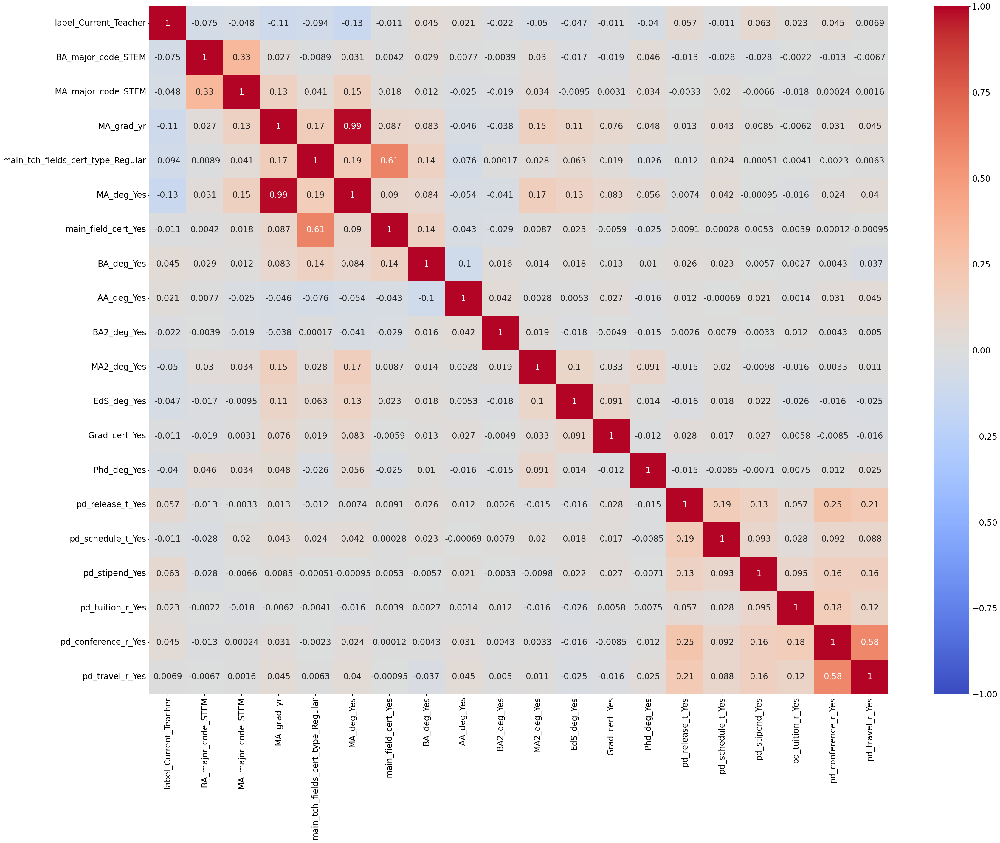

In [14]:
plt.rcParams['axes.titlesize']=18
plt.rcParams['axes.labelsize']=16
plt.rcParams['xtick.labelsize']=20
plt.rcParams['ytick.labelsize']=20

df_t2=df_r_t2.drop(['CNTLNUM_T', 'SCHCNTL', 'CNTLNUM_P'], axis=1).corr()
plt.figure(figsize=(40,30))
sns.heatmap(data=df_t2, annot=True, annot_kws={"size":20}, cmap='coolwarm', vmin=-1)
plt.show()

In [15]:
pd.DataFrame(df_t2['label_Current_Teacher'].nlargest(6).sort_values(ascending=False))

,label_Current_Teacher
label_Current_Teacher,1.000000
pd_stipend_Yes,0.062885
pd_release_t_Yes,0.056877
pd_conference_r_Yes,0.045354
BA_deg_Yes,0.045348
pd_tuition_r_Yes,0.023195


In [16]:
pd.DataFrame(df_t2['label_Current_Teacher'].nsmallest(5))

,label_Current_Teacher
MA_deg_Yes,-0.133055
MA_grad_yr,-0.107529
main_tch_fields_cert_type_Regular,-0.093737
BA_major_code_STEM,-0.075040
MA2_deg_Yes,-0.050238


Public Teachers education and training data do not show strong, neither positive or negative,  correlations between the features and Current teacher status. 

### Public Teachers #3 ###
- Features: `class_org`, `would_be_tch`, `remain_in_teaching`, `main_teaching_fields`, `main_teaching_lastyr`, `ft_pt_status`, `teaches_ungraded`, `teaches_pk`, `teaches_k`, `teaches_1st`, `teaches_2nd`, `teaches_3rd`, `teaches_4th`, `teaches_5th`, `teaches_6th`, `teaches_7th`, `teaches_8th`, `teaches_9th`, `teaches_10th`, `teaches_11th`, `teaches_12th`, `new_teacher`, `ever_taught_private_school`, `ELA_hours_taught`, `math_hours_taught`, `social_studies_taught`, `science_hours_taught`, `hours_required_school`, `total_teaching_exp`, `public_ft_exp`, `public_pt_exp`, `private_ft_exp`, `private_pt_exp`

In [17]:
cols=['CNTLNUM_T', 'SCHCNTL', 'CNTLNUM_P', 'label', 'T0206', 'T0339', 'T0340', 'T0102', 'T0120', 'FTPT_S', 'T0191', 'T0192', 'T0193', 'T0194', 'T0195', 'T0196', 'T0197', 'T0198', 'T0199', 'T0200', 'T0201', 'T0202', 'T0203', 'T0204', 'T0205', 'NEWTCH', 'T0067', 'T0209', 'T0210', 'T0211', 'T0212', 'T0273', 'TOTEXPER', 'T0065', 'T0066', 'T0068', 'T0069']
cols_new=['CNTLNUM_T', 'SCHCNTL', 'CNTLNUM_P', 'label_Current_Teacher', 'class_org', 'would_be_tch', 'remain_in_teaching', 'main_teaching_fields', 'main_teaching_lastyr', 'ft_pt_status', 'teaches_ungraded', 'teaches_pk', 'teaches_k', 'teaches_1st', 'teaches_2nd', 'teaches_3rd', 'teaches_4th', 'teaches_5th', 'teaches_6th', 'teaches_7th', 'teaches_8th', 'teaches_9th', 'teaches_10th', 'teaches_11th', 'teaches_12th', 'new_teacher', 'ever_taught_private_school', 'ELA_hours_taught', 'math_hours_taught', 'social_studies_taught', 'science_hours_taught', 'hours_required_school', 'total_teaching_exp', 'public_ft_exp', 'public_pt_exp', 'private_ft_exp', 'private_pt_exp']
cols_dummies=['class_org', 'main_teaching_lastyr', 'ft_pt_status', 'teaches_ungraded', 'teaches_pk', 'teaches_k', 'teaches_1st', 'teaches_2nd', 'teaches_3rd', 'teaches_4th', 'teaches_5th', 'teaches_6th', 'teaches_7th', 'teaches_8th', 'teaches_9th', 'teaches_10th', 'teaches_11th', 'teaches_12th', 'new_teacher', 'ever_taught_private_school']
cols_drop=['main_teaching_lastyr_2', 'main_teaching_lastyr_3', 'ft_pt_status_2', 'teaches_ungraded_-8', 'teaches_pk_-8', 'teaches_k_-8', 'teaches_1st_-8', 'teaches_2nd_-8', 'teaches_3rd_-8', 'teaches_4th_-8', 'teaches_5th_-8', 'teaches_6th_-8', 'teaches_7th_-8', 'teaches_8th_-8', 'teaches_9th_-8', 'teaches_10th_-8', 'teaches_11th_-8', 'teaches_12th_-8', 'new_teacher_2', 'ever_taught_private_school_2']
names={'main_teaching_lastyr_1': 'main_teaching_lastyr_Same_as_thisyr', 'ft_pt_status_1': 'ft_pt_status_FT', 'teaches_ungraded_1': 'teaches_ungraded_Yes', 'teaches_pk_1': 'teaches_pk_Yes', 'teaches_k_1': 'teaches_k_Yes', 'teaches_1st_1': 'teaches_1st_Yes', 'teaches_2nd_1': 'teaches_2nd_Yes', 'teaches_3rd_1': 'teaches_3rd_Yes', 'teaches_4th_1': 'teaches_4th_Yes', 'teaches_5th_1': 'teaches_5th_Yes', 'teaches_6th_1': 'teaches_6th_Yes', 'teaches_7th_1': 'teaches_7th_Yes', 'teaches_8th_1': 'teaches_8th_Yes', 'teaches_9th_1': 'teaches_9th_Yes', 'teaches_10th_1': 'teaches_10th_Yes', 'teaches_11th_1': 'teaches_11th_Yes', 'teaches_12th_1': 'teaches_12th_Yes', 'new_teacher_1': 'new_teacher_Yes', 'ever_taught_private_school_1': 'ever_taught_private_school_Yes'}

In [18]:
ren=dict(zip(cols, cols_new))
df_r_t3=df[cols].copy()
df_r_t3.rename(columns=ren, inplace=True)

In [19]:
keys=np.sort(df_r_t3.class_org.unique())
values=['Departmentalized', 'Elementary', 'Self_Contained', 'Team_Teaching', 'Pull_Out']
ren=dict(zip(keys, values))
df_r_t3.class_org=df_r_t3.class_org.map(ren)

In [20]:
df_r_t3=pd.get_dummies(df_r_t3, columns=cols_dummies, prefix=cols_dummies)
print([ index+', '+str(count) for index,count in zip(df_r_t3.isna().sum().index, df_r_t3.isna().sum()) if count != 0])

df_r_t3.drop(cols_drop, axis=1, inplace=True)
# df_r_t3.columns

df_r_t3.rename(columns=names, inplace=True)
print([ index+', '+str(count) for index,count in zip(df_r_t3.isna().sum().index, df_r_t3.isna().sum()) if count != 0])

[]
[]


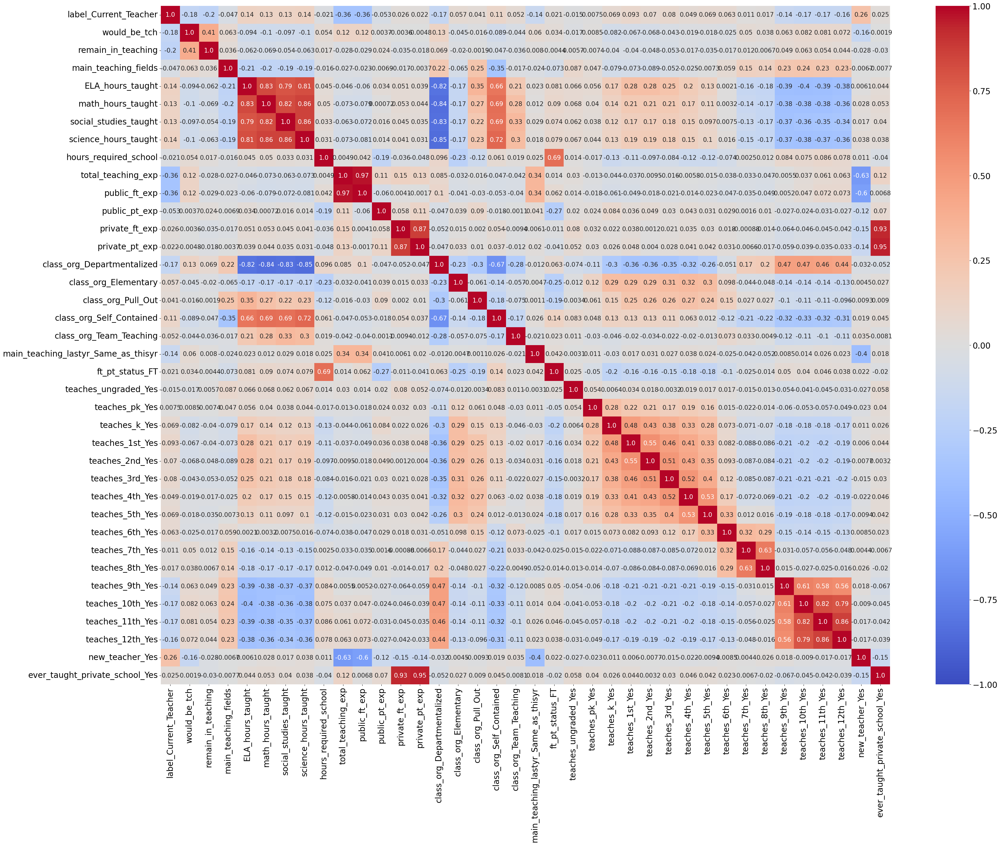

In [21]:
plt.rcParams['axes.titlesize']=18
plt.rcParams['axes.labelsize']=16
plt.rcParams['xtick.labelsize']=20
plt.rcParams['ytick.labelsize']=20

df_t3=df_r_t3.drop(['CNTLNUM_T', 'SCHCNTL', 'CNTLNUM_P'], axis=1).corr()
plt.figure(figsize=(40,30))
sns.heatmap(data=df_t3, annot=True, annot_kws={"size":15}, fmt=".2", cmap='coolwarm', vmin=-1)
plt.show()

In [22]:
pd.DataFrame(df_t3['label_Current_Teacher'].nlargest(6).sort_values(ascending=False))

,label_Current_Teacher
label_Current_Teacher,1.000000
new_teacher_Yes,0.258777
ELA_hours_taught,0.138732
science_hours_taught,0.135584
math_hours_taught,0.132216
social_studies_taught,0.126285


In [23]:
pd.DataFrame(df_t3['label_Current_Teacher'].nsmallest(5))

,label_Current_Teacher
public_ft_exp,-0.357457
total_teaching_exp,-0.357093
remain_in_teaching,-0.203764
would_be_tch,-0.181978
teaches_11th_Yes,-0.171054


Public Teachers teaching experience demonstrates some correlations overall among other features of Public Teachers. 

`new_teacher`, the teachers working 3 years or less, has slight positive correlation with Current teacher status.
Both `public_ft_exp` and `total_teaching_exp` have slight negative correlation with Current teacher status in which as those teachers remain working as a teacher for longer years in (public) school, they tend to become Former teacher.


### Public School ###
- Features: `type`, `level`, `urbanicity`, `FRPL_eligible`, `FRPL_NLP_participate`, `title_I_reading`, `title_I_math`, `title_I_esl`, `title_I_receive_students`, `percent_minority_students`, `percent_minority_teachers`, `FRPL_eligible_pk_students`, `FRPL_eligible_k_12_students`, `FRPL_approved_pk_students`, `FRPL_approved_k_12_students`, `title_I_receive_students_number`, `student_teacher_ratio`, `vacnc_gen_elem`, `vacnc_spec_ed`, `vacnc_english`, `vacnc_soc_st`, `vacnc_esl`, `vacnc_foreign_lang`, `vacnc_music_or_art`, `vacnc_vo_tech`, `vacnc_comp_sci`, `vacnc_math`, `vacnc_biology`, `vacnc_phys_sci`

In [24]:
##NEW
cols=['CNTLNUM_T', 'SCHCNTL', 'CNTLNUM_P', 'label', 'PGMTYPE', 'SCHLEVEL', 'URBANIC', 'S0282', 'S0285', 'S0306', 'S0307', 'S0308', 'S0288', 'MINENR', 'MINTCH', 'S0283', 'S0284', 'S0286', 'S0287', 'S0290', 'STU_TCH', 'S0265', 'S0266', 'S0267', 'S0268', 'S0269', 'S0270', 'S0271', 'S0272', 'S0273', 'S0274', 'S0275', 'S0276']
cols_new=['CNTLNUM_T', 'SCHCNTL', 'CNTLNUM_P', 'label_Current_Teacher', 'type', 'level', 'urbanicity', 'FRPL_eligible', 'FRPL_NLP_participate', 'title_I_reading', 'title_I_math', 'title_I_esl', 'title_I_receive_students', 'percent_minority_students', 'percent_minority_teachers', 'FRPL_eligible_pk_students', 'FRPL_eligible_k_12_students', 'FRPL_approved_pk_students', 'FRPL_approved_k_12_students', 'title_I_receive_students_number', 'student_teacher_ratio', 'vacnc_gen_elem', 'vacnc_spec_ed', 'vacnc_english', 'vacnc_soc_st', 'vacnc_comp_sci', 'vacnc_math', 'vacnc_biology', 'vacnc_phys_sci', 'vacnc_esl', 'vacnc_foreign_lang', 'vacnc_music_or_art', 'vacnc_vo_tech']
cols_dummies=['type', 'level', 'urbanicity', 'FRPL_eligible', 'FRPL_NLP_participate', 'title_I_reading', 'title_I_math', 'title_I_esl', 'title_I_receive_students']
cols_drop=['FRPL_eligible_2', 'FRPL_eligible_3', 'FRPL_NLP_participate_2', 'FRPL_NLP_participate_-8', 'title_I_reading_2', 'title_I_reading_-8', 'title_I_math_2', 'title_I_math_-8', 'title_I_esl_2', 'title_I_esl_-8', 'title_I_receive_students_2']
names={'FRPL_eligible_1': 'FRPL_eligible_Yes', 'FRPL_NLP_participate_1': 'FRPL_NLP_participate_Yes', 'title_I_reading_1': 'title_I_reading_Yes', 'title_I_math_1': 'title_I_math_Yes', 'title_I_esl_1': 'title_I_esl_Yes', 'title_I_receive_students_1': 'title_I_receive_students_Yes'}

In [25]:
ren=dict(zip(cols, cols_new))
df_r_s1=df[cols].copy()
df_r_s1.rename(columns=ren, inplace=True)

In [26]:
keys=np.sort(df_r_s1.type.unique())
values=['Regular', 'Elementary', 'Special', 'Voc_Tech', 'Alternative']
ren=dict(zip(keys, values))
df_r_s1.type=df_r_s1.type.map(ren)

keys=np.sort(df_r_s1.level.unique())
values=['Elementary', 'Secondary', 'Combined']
ren=dict(zip(keys, values))
df_r_s1.level=df_r_s1.level.map(ren)

keys=np.sort(df_r_s1.urbanicity.unique())
values=['Large_Mid_Central_City', 'Urban_Fringe_of_Large_Mid_City', 'Small_town_Rural']
ren=dict(zip(keys, values))
df_r_s1.urbanicity=df_r_s1.urbanicity.map(ren)

In [27]:
df_r_s1=pd.get_dummies(df_r_s1, columns=cols_dummies, prefix=cols_dummies)
print([ index+', '+str(count) for index,count in zip(df_r_s1.isna().sum().index, df_r_s1.isna().sum()) if count != 0])

df_r_s1.drop(cols_drop, axis=1, inplace=True)
# df_r_s1.columns

df_r_s1.rename(columns=names, inplace=True)
print([ index+', '+str(count) for index,count in zip(df_r_s1.isna().sum().index, df_r_s1.isna().sum()) if count != 0])

[]
[]


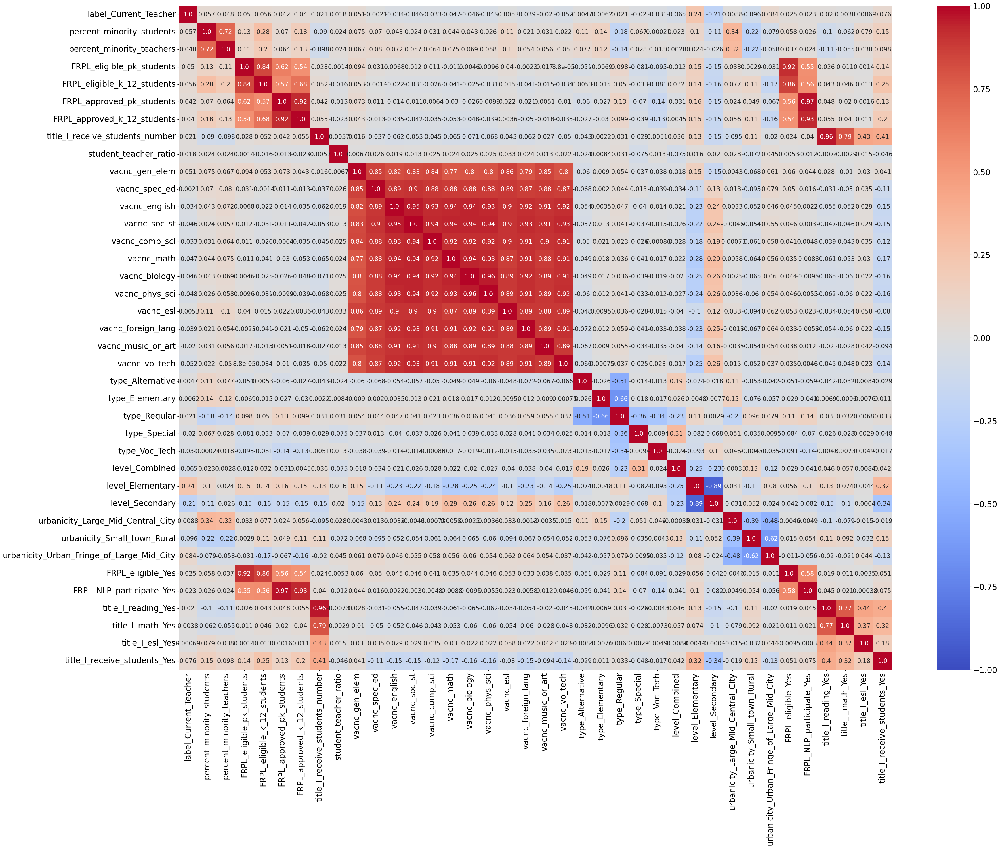

In [28]:
plt.rcParams['axes.titlesize']=18
plt.rcParams['axes.labelsize']=16
plt.rcParams['xtick.labelsize']=20
plt.rcParams['ytick.labelsize']=20

df_s1=df_r_s1.drop(['CNTLNUM_T', 'SCHCNTL', 'CNTLNUM_P'], axis=1).corr()
plt.figure(figsize=(40,30))
sns.heatmap(data=df_s1, annot=True, annot_kws={"size":15}, fmt=".2", cmap='coolwarm', vmin=-1)
plt.show()

In [29]:
pd.DataFrame(df_s1['label_Current_Teacher'].nlargest(6).sort_values(ascending=False))

,label_Current_Teacher
label_Current_Teacher,1.000000
level_Elementary,0.237514
urbanicity_Urban_Fringe_of_Large_Mid_City,0.083934
title_I_receive_students_Yes,0.075623
percent_minority_students,0.056925
FRPL_eligible_k_12_students,0.055700


In [30]:
pd.DataFrame(df_s1['label_Current_Teacher'].nsmallest(5))

,label_Current_Teacher
level_Secondary,-0.207980
urbanicity_Small_town_Rural,-0.096131
level_Combined,-0.064510
vacnc_vo_tech,-0.051656
vacnc_phys_sci,-0.048461


Public School general and poverty proxy information have the levels of the schools where the teachers are teaching as the significant correlation for positive and negative correlations, with similarly weak linear relationship. As teachers work in a school `level_Elementary` tend to continue teaching, teachers work in a school `level_Secondary` tend to leave their teaching job.

### Public Principal and Public District Incentive Policy ###
- Features: `deg_highest`, `race_p`, `gender_p`, `age_p`, `salary`, `yrs_princpl_this_sch`, `yrs_princpl_oth_schls`, `yrs_tchng_before_princpl`, `yrs_tchng_since_princpl`, `incentives_certification`, `incentives_excellence`, `incentives_prof_dev`, `incentives_location`, `incentives_reten`, `incentives_reten_gen_elem`, `incentives_reten_spec_ed`, `incentives_reten_english`, `incentives_reten_soc_studies`, `incentives_reten_STEM_comp_sci`, `incentives_reten_STEM_math`, `incentives_reten_STEM_phys_sci`, `incentives_reten_STEM_biology`, `incentives_reten_esl`, `incentives_reten_foreign_lang`, `incentives_reten_music_art`, `incentives_reten_voc_ed`

In [31]:
cols=['CNTLNUM_T', 'SCHCNTL', 'CNTLNUM_P', 'label', 'A0225', 'RACETH_P', 'A0227', 'AGE_P', 'A0226', 'A0053', 'A0054', 'A0055', 'A0056', 'S1611', 'S1612', 'S1613', 'S1614', 'S1615', 'S1616', 'S1617', 'S1618', 'S1619', 'S1620', 'S1621', 'S1622', 'S1623', 'S1624', 'S1625', 'S1626', 'S1627']
cols_new=['CNTLNUM_T', 'SCHCNTL', 'CNTLNUM_P', 'label_Current_Teacher', 'deg_highest', 'race_p', 'gender_p', 'age_p', 'salary', 'yrs_princpl_this_sch', 'yrs_princpl_oth_schls', 'yrs_tchng_before_princpl', 'yrs_tchng_since_princpl', 'incentives_certification', 'incentives_excellence', 'incentives_prof_dev', 'incentives_location', 'incentives_reten', 'incentives_reten_gen_elem', 'incentives_reten_spec_ed', 'incentives_reten_english', 'incentives_reten_soc_studies', 'incentives_reten_STEM_comp_sci', 'incentives_reten_STEM_math', 'incentives_reten_STEM_phys_sci', 'incentives_reten_STEM_biology', 'incentives_reten_esl', 'incentives_reten_foreign_lang', 'incentives_reten_music_art', 'incentives_reten_voc_ed']
cols_dummies=['deg_highest', 'race_p', 'gender_p', 'incentives_certification', 'incentives_excellence', 'incentives_prof_dev', 'incentives_location', 'incentives_reten', 'incentives_reten_gen_elem', 'incentives_reten_spec_ed', 'incentives_reten_english', 'incentives_reten_soc_studies', 'incentives_reten_STEM_comp_sci', 'incentives_reten_STEM_math', 'incentives_reten_STEM_phys_sci', 'incentives_reten_STEM_biology', 'incentives_reten_esl', 'incentives_reten_foreign_lang', 'incentives_reten_music_art', 'incentives_reten_voc_ed']
cols_drop=['gender_p_1', 'incentives_certification_2', 'incentives_certification_-9', 'incentives_excellence_2', 'incentives_excellence_-9', 'incentives_prof_dev_2', 'incentives_prof_dev_-9', 'incentives_location_2', 'incentives_location_-9', 'incentives_reten_2', 'incentives_reten_-9', 'incentives_reten_gen_elem_2', 'incentives_reten_gen_elem_-8', 'incentives_reten_gen_elem_-9', 'incentives_reten_spec_ed_2', 'incentives_reten_spec_ed_-8', 'incentives_reten_spec_ed_-9', 'incentives_reten_english_2', 'incentives_reten_english_-8', 'incentives_reten_english_-9', 'incentives_reten_soc_studies_2', 'incentives_reten_soc_studies_-8', 'incentives_reten_soc_studies_-9', 'incentives_reten_STEM_comp_sci_2', 'incentives_reten_STEM_comp_sci_-8', 'incentives_reten_STEM_comp_sci_-9', 'incentives_reten_STEM_math_2', 'incentives_reten_STEM_math_-8', 'incentives_reten_STEM_math_-9', 'incentives_reten_STEM_phys_sci_2', 'incentives_reten_STEM_phys_sci_-8', 'incentives_reten_STEM_phys_sci_-9', 'incentives_reten_STEM_biology_2', 'incentives_reten_STEM_biology_-8', 'incentives_reten_STEM_biology_-9', 'incentives_reten_esl_2', 'incentives_reten_esl_-8', 'incentives_reten_esl_-9', 'incentives_reten_foreign_lang_2', 'incentives_reten_foreign_lang_-8', 'incentives_reten_foreign_lang_-9', 'incentives_reten_music_art_2', 'incentives_reten_music_art_-8', 'incentives_reten_music_art_-9', 'incentives_reten_voc_ed_2', 'incentives_reten_voc_ed_-8', 'incentives_reten_voc_ed_-9']
names={'race_p_1': 'race_p_AIAN', 'race_p_2': 'race_p_Asian', 'race_p_3': 'race_p_Black', 'race_p_4': 'race_p_White', 'race_p_5': 'race_p_Hispanic', 'gender_p_2': 'gender_p_Female', 'incentives_certification_1': 'incentives_certification_Yes', 'incentives_excellence_1': 'incentives_excellence_Yes', 'incentives_prof_dev_1': 'incentives_prof_dev_Yes', 'incentives_location_1': 'incentives_location_Yes', 'incentives_reten_1': 'incentives_reten_Yes', 'incentives_reten_gen_elem_1': 'incentives_reten_gen_elem_Yes', 'incentives_reten_spec_ed_1': 'incentives_reten_spec_ed_Yes', 'incentives_reten_english_1': 'incentives_reten_english_Yes', 'incentives_reten_soc_studies_1': 'incentives_reten_soc_studies_Yes', 'incentives_reten_STEM_comp_sci_1': 'incentives_reten_STEM_comp_sci_Yes', 'incentives_reten_STEM_math_1': 'incentives_reten_STEM_math_Yes', 'incentives_reten_STEM_phys_sci_1': 'incentives_reten_STEM_phys_sci_Yes', 'incentives_reten_STEM_biology_1': 'incentives_reten_STEM_biology_Yes', 'incentives_reten_esl_1': 'incentives_reten_esl_Yes', 'incentives_reten_foreign_lang_1': 'incentives_reten_foreign_lang_Yes', 'incentives_reten_music_art_1': 'incentives_reten_music_art_Yes', 'incentives_reten_voc_ed_1': 'incentives_reten_voc_ed_Yes'}

In [32]:
ren=dict(zip(cols, cols_new))
df_r_p1=df[cols].copy()
df_r_p1.rename(columns=ren, inplace=True)

In [33]:
keys=np.sort(df_r_p1.deg_highest.unique())
values=['Associate', 'Bachelors', 'Masters', 'Educational_Specialist', 'Doctorate']
ren=dict(zip(keys, values))
df_r_p1.deg_highest=df_r_p1.deg_highest.map(ren)

In [34]:
df_r_p1=pd.get_dummies(df_r_p1, columns=cols_dummies, prefix=cols_dummies)
print([ index+', '+str(count) for index,count in zip(df_r_p1.isna().sum().index, df_r_p1.isna().sum()) if count != 0])

df_r_p1.drop(cols_drop, axis=1, inplace=True)
# df_r_p1.columns

df_r_p1.rename(columns=names, inplace=True)
print([ index+', '+str(count) for index,count in zip(df_r_p1.isna().sum().index, df_r_p1.isna().sum()) if count != 0])

[]
[]


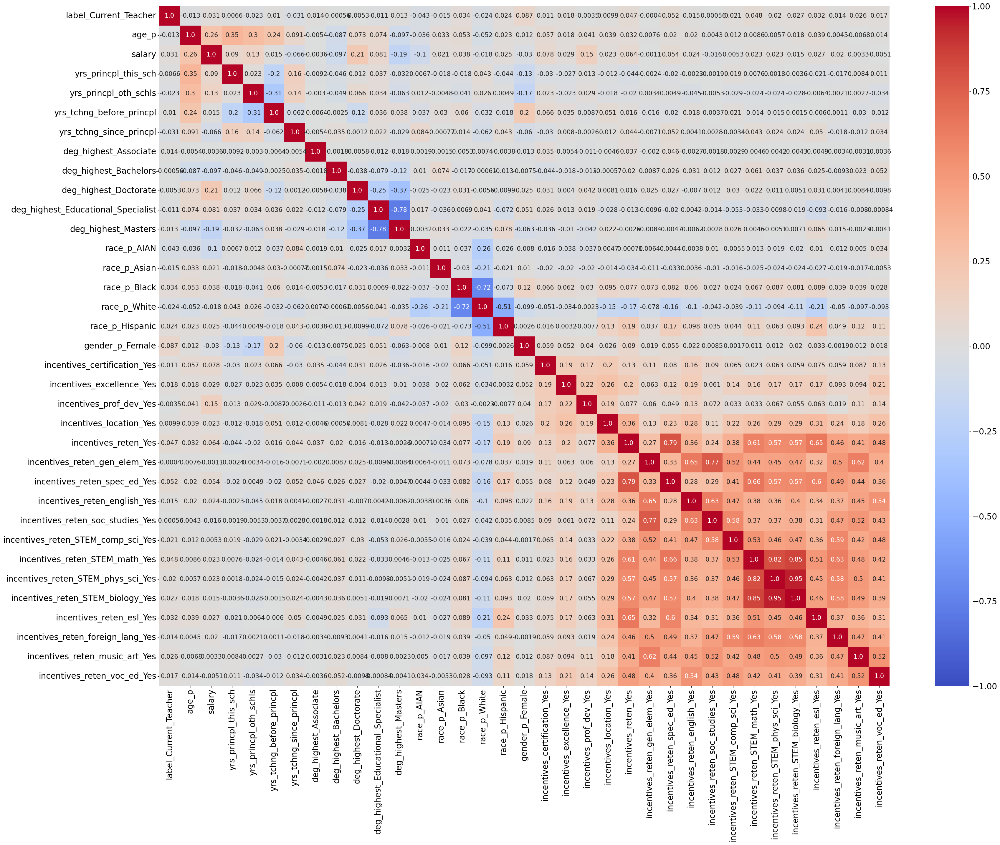

In [35]:
plt.rcParams['axes.titlesize']=18
plt.rcParams['axes.labelsize']=16
plt.rcParams['xtick.labelsize']=20
plt.rcParams['ytick.labelsize']=20

df_p1=df_r_p1.drop(['CNTLNUM_T', 'SCHCNTL', 'CNTLNUM_P'], axis=1).corr()
plt.figure(figsize=(40,30))
sns.heatmap(data=df_p1, annot=True, annot_kws={"size":15}, fmt=".2", cmap='coolwarm', vmin=-1)
plt.show()

In [36]:
pd.DataFrame(df_p1['label_Current_Teacher'].nlargest(6).sort_values(ascending=False))

,label_Current_Teacher
label_Current_Teacher,1.000000
gender_p_Female,0.087117
incentives_reten_spec_ed_Yes,0.051876
incentives_reten_STEM_math_Yes,0.048123
incentives_reten_Yes,0.046877
race_p_Black,0.034169


In [37]:
pd.DataFrame(df_p1['label_Current_Teacher'].nsmallest(5))

,label_Current_Teacher
race_p_AIAN,-0.042703
yrs_tchng_since_princpl,-0.030685
race_p_White,-0.024051
yrs_princpl_oth_schls,-0.023245
race_p_Asian,-0.015437


In general, Public Principal information and Public District incentive policy do not show correlations between the features and Current teacher status. 

In [38]:
df_new=df_r_t1.join(df_r_t2.set_index(['CNTLNUM_T', 'SCHCNTL', 'CNTLNUM_P','label_Current_Teacher']), on=['CNTLNUM_T', 'SCHCNTL', 'CNTLNUM_P','label_Current_Teacher'])
df_r_t2.reset_index()
df_new=df_new.join(df_r_t3.set_index(['CNTLNUM_T', 'SCHCNTL', 'CNTLNUM_P','label_Current_Teacher']), on=['CNTLNUM_T', 'SCHCNTL', 'CNTLNUM_P','label_Current_Teacher'])
df_r_t3.reset_index()
df_new=df_new.join(df_r_s1.set_index(['CNTLNUM_T', 'SCHCNTL', 'CNTLNUM_P','label_Current_Teacher']), on=['CNTLNUM_T', 'SCHCNTL', 'CNTLNUM_P','label_Current_Teacher'])
df_r_s1.reset_index()
df_new=df_new.join(df_r_p1.set_index(['CNTLNUM_T', 'SCHCNTL', 'CNTLNUM_P','label_Current_Teacher']), on=['CNTLNUM_T', 'SCHCNTL', 'CNTLNUM_P','label_Current_Teacher'])
df_r_p1.reset_index()
df_new.shape

(3640, 155)

In [39]:
cols_neg=['MA_grad_yr', 'ELA_hours_taught', 'math_hours_taught', 'social_studies_taught', 'science_hours_taught', 'private_ft_exp', 'private_pt_exp', 'FRPL_eligible_pk_students', 'FRPL_eligible_k_12_students', 'FRPL_approved_pk_students', 'FRPL_approved_k_12_students', 'title_I_receive_students_number', 'vacnc_gen_elem', 'vacnc_spec_ed', 'vacnc_english', 'vacnc_soc_st', 'vacnc_comp_sci', 'vacnc_math', 'vacnc_biology', 'vacnc_phys_sci', 'vacnc_esl', 'vacnc_foreign_lang', 'vacnc_music_or_art', 'vacnc_vo_tech']

for col in cols_neg:
    df_new[col]=df_new[col].apply(lambda x: 0 if x <= -8 else x)

In [40]:
cols_ren={'label_Current_Teacher': 'label_Current', 'age_t': 'age_T', 'total_yearly_earnings': 'earnings_total', 'school_related_earnings': 'earnings_school', 'base_salary_amt': 'base_salary_T', 'number_of_dependents': 'num_dependents', 'dependents_under_age_5': 'dependents_age5', 'marital_status_Married': 'married', 'race_t_AIAN': 'race_T_AIAN', 'race_t_Asian': 'race_T_Asian', 'race_t_Black': 'race_T_Black', 'race_t_White': 'race_T_White', 'race_t_Hispanic': 'race_T_Hispanic', 'gender_t_Female': 'gender_T_Female', 'summer_teaching_Yes': 'summer_teaching', 'nonteaching_job_Yes': 'nonteaching_job', 'nonschool_job_Yes': 'nonschool_job', 'extracur_act_Yes': 'extracur_act', 'merit_pay_Yes': 'merit_pay', 'outside_pay_Yes': 'outside_pay', 'union_member_Yes': 'union_member', 'BA_major_code_STEM': 'BA_major_STEM', 'MA_major_code_STEM': 'MA_major_STEM', 'main_tch_fields_cert_type_Regular': 'field_cert_Regular', 'MA_deg_Yes': 'deg_T_MA', 'main_field_cert_Yes': 'field_cert', 'BA_deg_Yes': 'deg_T_BA', 'AA_deg_Yes': 'deg_T_AA', 'BA2_deg_Yes': 'deg_T_BA2', 'MA2_deg_Yes': 'deg_T_MA2', 'EdS_deg_Yes': 'deg_T_EdS', 'Grad_cert_Yes': 'grad_cert', 'Phd_deg_Yes': 'deg_T_Phd', 'pd_release_t_Yes': 'pd_release_t', 'pd_schedule_t_Yes': 'pd_schedule_t', 'pd_stipend_Yes': 'pd_stipend', 'pd_tuition_r_Yes': 'pd_tuition_r', 'pd_conference_r_Yes': 'pd_conference_r', 'pd_travel_r_Yes': 'pd_travel_r', 'remain_in_teaching': 'remain_teaching', 'main_teaching_fields': 'field', 'ELA_hours_taught': 'hrs_tch_ELA', 'math_hours_taught': 'hrs_tch_math', 'social_studies_taught': 'hrs_tch_social', 'science_hours_taught': 'hrs_tch_science', 'hours_required_school': 'hrs_in_school_wk', 'total_teaching_exp': 'total_tch_yr', 'class_org_Departmentalized': 'class_Departmentalized', 'class_org_Elementary': 'class_Elementary', 'class_org_Pull_Out': 'class_PullOut', 'class_org_Self_Contained': 'class_Self', 'class_org_Team_Teaching': 'class_Team', 'main_teaching_lastyr_Same_as_thisyr': 'field_same', 'ft_pt_status_FT': 'full_time', 'teaches_ungraded_Yes': 'teaches_ungraded', 'teaches_pk_Yes': 'teaches_pk', 'teaches_k_Yes': 'teaches_k', 'teaches_1st_Yes': 'teaches_1st', 'teaches_2nd_Yes': 'teaches_2nd', 'teaches_3rd_Yes': 'teaches_3rd', 'teaches_4th_Yes': 'teaches_4th', 'teaches_5th_Yes': 'teaches_5th', 'teaches_6th_Yes': 'teaches_6th', 'teaches_7th_Yes': 'teaches_7th', 'teaches_8th_Yes': 'teaches_8th', 'teaches_9th_Yes': 'teaches_9th', 'teaches_10th_Yes': 'teaches_10th', 'teaches_11th_Yes': 'teaches_11th', 'teaches_12th_Yes': 'teaches_12th', 'new_teacher_Yes': 'new_teacher', 'ever_taught_private_school_Yes': 'private_exp', 'percent_minority_students': 'minority_students', 'percent_minority_teachers': 'minority_teachers', 'FRPL_eligible_pk_students': 'FRPL_eligible_pk', 'FRPL_eligible_k_12_students': 'FRPL_eligible_k12', 'FRPL_approved_pk_students': 'FRPL_approved_pk', 'FRPL_approved_k_12_students': 'FRPL_approved_k12', 'title_I_receive_students_number': 'title_I_receive_number', 'student_teacher_ratio': 'stu_tch_ratio', 'urbanicity_Large_Mid_Central_City': 'urbanicity_LargeCity', 'urbanicity_Small_town_Rural': 'urbanicity_SmallTown', 'urbanicity_Urban_Fringe_of_Large_Mid_City': 'urbanicity_MidCity', 'FRPL_eligible_Yes': 'FRPL_eligible', 'FRPL_NLP_participate_Yes': 'NLP_participate', 'title_I_reading_Yes': 'title_I_reading', 'title_I_math_Yes': 'title_I_math', 'title_I_esl_Yes': 'title_I_esl', 'title_I_receive_students_Yes': 'title_I_receive', 'age_p': 'age_P', 'salary': 'salary_P', 'yrs_princpl_this_sch': 'yrs_P_this_sch', 'yrs_princpl_oth_schls': 'yrs_P_oth_schls', 'yrs_tchng_before_princpl': 'yrs_tch_before_P', 'yrs_tchng_since_princpl': 'yrs_tch_since_P', 'deg_highest_Associate': 'deg_P_Associate', 'deg_highest_Bachelors': 'deg_P_Bachelors', 'deg_highest_Doctorate': 'deg_P_Doctorate', 'deg_highest_Educational_Specialist': 'deg_P_Edu', 'deg_highest_Masters': 'deg_P_Masters', 'race_p_AIAN': 'race_P_AIAN', 'race_p_Asian': 'race_P_Asian', 'race_p_Black': 'race_P_Black', 'race_p_White': 'race_P_White', 'race_p_Hispanic': 'race_P_Hispanic', 'gender_p_Female': 'gender_P_Female', 'incentives_certification_Yes': 'incen_certification', 'incentives_excellence_Yes': 'incen_excellence', 'incentives_prof_dev_Yes': 'incen_prof_dev', 'incentives_location_Yes': 'incen_location', 'incentives_reten_Yes': 'incen_reten', 'incentives_reten_gen_elem_Yes': 'incen_reten_gen_elem', 'incentives_reten_spec_ed_Yes': 'incen_reten_spec_ed', 'incentives_reten_english_Yes': 'incen_reten_english', 'incentives_reten_soc_studies_Yes': 'incen_reten_soc_studies', 'incentives_reten_STEM_comp_sci_Yes': 'incen_reten_STEM_comp_sci', 'incentives_reten_STEM_math_Yes': 'incen_reten_STEM_math', 'incentives_reten_STEM_phys_sci_Yes': 'incen_reten_STEM_phys_sci', 'incentives_reten_STEM_biology_Yes': 'incen_reten_STEM_biology', 'incentives_reten_esl_Yes': 'incen_reten_esl', 'incentives_reten_foreign_lang_Yes': 'incen_reten_foreign_lang', 'incentives_reten_music_art_Yes': 'incen_reten_music_art', 'incentives_reten_voc_ed_Yes': 'incen_reten_voc_ed'}

In [41]:
df_new.rename(columns=cols_ren).to_csv('../../data/data_clean/SASS_cleaned_v1.csv', index=False)

## Feature Selection - Correlation Filtering ##

As the heatmaps above shown, some features have high correlation with any other features if they the pair has linearly related each other. The purpose of filtering the features is to obatin dimensionality reduction and clear view for feature importances.

The pair with high correlation is selected with threshold 40%, then one of them is considered to be removed or aggregated into either categorical or continuous type. This selection is made after comparing the correlation with the target label - selecting the feature with higher correation with the label.


In [42]:
cols_t1=df_t1.columns
cols_t2=df_t2.columns
cols_t3=df_t3.columns
cols_s1=df_s1.columns
cols_p1=df_p1.columns

### Public Teachers #1 ###

In [43]:
df_t1=np.abs(df_t1)
df_t1[df_t1 == 1] = -100
corr_pair=df_t1[df_t1>0.4].dropna(axis='columns', how='all').dropna(axis=0, how='all')
corr_pair

,age_t,total_yearly_earnings,school_related_earnings,base_salary_amt,number_of_dependents,dependents_under_age_5,region_Midwest,region_South,region_West,race_t_Black,race_t_White,race_t_Hispanic,nonschool_job_Yes,outside_pay_Yes
age_t,NaN,0.469996,0.502484,0.517636,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
total_yearly_earnings,0.469996,NaN,0.931635,0.851417,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
school_related_earnings,0.502484,0.931635,NaN,0.899384,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
base_salary_amt,0.517636,0.851417,0.899384,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
number_of_dependents,NaN,NaN,NaN,NaN,NaN,0.416165,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
dependents_under_age_5,NaN,NaN,NaN,NaN,0.416165,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
region_Midwest,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.454695,NaN,NaN,NaN,NaN,NaN,NaN
region_South,NaN,NaN,NaN,NaN,NaN,NaN,0.454695,NaN,0.420802,NaN,NaN,NaN,NaN,NaN
region_West,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.420802,NaN,NaN,NaN,NaN,NaN,NaN
race_t_Black,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.612472,NaN,NaN,NaN


### Public Teachers #2 ###

In [44]:
df_t2=np.abs(df_t2)
df_t2[df_t2 == 1] = -100
corr_pair=df_t2[df_t2>0.4].dropna(axis='columns', how='all').dropna(axis=0, how='all')
# corr_pair

 - aggregating `pd_release_t_Yes` `pd_schedule_t_Yes` into `pd_time`
 - aggregating `pd_stipend_Yes` `pd_tuition_r_Yes` `pd_conference_r_Yes` `pd_travel_r_Yes` into `pd_finance`

In [45]:
df_new['pd_time']=df_new.apply(lambda x: int(x.pd_schedule_t_Yes + x.pd_release_t_Yes), axis=1)
df_new['pd_time']=df_new.pd_time.apply(lambda x: 1 if x==2 else x)

df_new['pd_finance']=df_new.apply(lambda x: int(x.pd_stipend_Yes + x.pd_tuition_r_Yes + x.pd_conference_r_Yes + x.pd_travel_r_Yes), axis=1)
df_new['pd_finance']=df_new.pd_finance.apply(lambda x: 1 if x>1 else x)

### Public Teachers #3 ###

In [46]:
df_t3=np.abs(df_t3)
df_t3[df_t3 == 1] = -100
corr_pair=df_t3[df_t3>0.4].dropna(axis='columns', how='all').dropna(axis=0, how='all')
# corr_pair

 - aggregating `math_hours_taught` `science_hours_taught` into `STEM_hours_taught`

In [47]:
df_new['STEM_hours_taught']=df_new.apply(lambda x: int(x.math_hours_taught+x.science_hours_taught), axis=1)
df_new['STEM_hours_taught']=df_new.STEM_hours_taught.apply(lambda x: 0 if x==-16 else int(x))

 - categorizing `class_org_Pull_Out` `class_org_Team_Teaching` `class_org_Elementary` `class_org_Self_Contained` `class_org_Departmentalized` into `class_org`

In [48]:
def class_org(df_new):
    if df_new.class_org_Departmentalized == 1: return 1
    if df_new.class_org_Elementary == 1: return 2
    if df_new.class_org_Self_Contained == 1: return 3
    if df_new.class_org_Team_Teaching == 1: return 4
    if df_new.class_org_Pull_Out == 1: return 5

df_new['class_org']=df_new.apply(lambda x: class_org(x), axis=1)

- aggregating `teaches_7th_Yes`, `teaches_8th_Yes`, `teaches_9th_Yes`, `teaches_10th_Yes`, `teaches_11th_Yes`, `teaches_12th_Yes` into `teaches_7_to_12`

In [49]:
df_new['teaches_7_to_12']=df_new.apply(lambda x: 1 if x.teaches_7th_Yes+x.teaches_8th_Yes+x.teaches_9th_Yes+x.teaches_10th_Yes+x.teaches_11th_Yes+x.teaches_12th_Yes>0 else 0, axis=1)

- binary categorizing `main_teaching_fields` into `STEM_teaching_field`

In [50]:
df_new['STEM_teaching_field']=df_new.main_teaching_fields.apply(lambda x: 1 if x in [16, 32, 33, 34, 35, 36, 37, 38] else 0)

### Public School ###

In [51]:
df_s1=np.abs(df_s1)
df_s1[df_s1 == 1] = -100
corr_pair=df_s1[df_s1>0.4].dropna(axis='columns', how='all').dropna(axis=0, how='all')
# corr_pair

- aggregating `type_Alternative`, `type_Elementary`, `type_Regular`, `type_Special`, `type_Voc_Tech` into `sch_type`

In [52]:
def sch_type(df_new):
    if df_new.type_Regular == 1: return 1
    if df_new.type_Elementary == 1: return 3
    if df_new.type_Special == 1: return 4
    if df_new.type_Voc_Tech == 1: return 5
    if df_new.type_Alternative == 1: return 6

df_new['sch_type']=df_new.apply(lambda x: int(sch_type(x)), axis=1)

- aggregating `urbanicity_Large_Mid_Central_City`, `urbanicity_Small_town_Rural`, `urbanicity_Urban_Fringe_of_Large_Mid_City` into `urbanicity`

In [53]:
def urbanicity(df_new):
    if df_new.urbanicity_Large_Mid_Central_City == 1: return 1
    if df_new.urbanicity_Urban_Fringe_of_Large_Mid_City == 1: return 2
    if df_new.urbanicity_Small_town_Rural == 1: return 3

df_new['urbanicity']=df_new.apply(lambda x: int(urbanicity(x)), axis=1)

- aggregating `vacnc_gen_elem`, `vacnc_spec_ed`, `vacnc_english`, `vacnc_soc_st`, `vacnc_esl`, `vacnc_foreign_lang`, `vacnc_music_or_art`, `vacnc_vo_tech` into `vacnc_difficult_non_STEM_Yes`
- aggregating `vacnc_comp_sci`, `vacnc_math`, `vacnc_biology`, `vacnc_phys_sci` into `vacnc_difficult_STEM_Yes`

In [54]:
#NEW    
cols_non_STEM=['vacnc_gen_elem', 'vacnc_spec_ed', 'vacnc_english', 'vacnc_soc_st', 'vacnc_esl', 'vacnc_foreign_lang', 'vacnc_music_or_art', 'vacnc_vo_tech']
cols_STEM=['vacnc_comp_sci', 'vacnc_math', 'vacnc_biology', 'vacnc_phys_sci']

for col in cols_non_STEM+cols_STEM:
    df_new[col]=df_new[col].apply(lambda x: 1 if x>3 else 0)

df_new['vacnc_difficult_non_STEM_Yes']=df_new[cols_non_STEM].apply(lambda x: 1 if sum(x)>0 else 0, axis=1)
df_new['vacnc_difficult_STEM_Yes']=df_new[cols_STEM].apply(lambda x: 1 if sum(x)>0 else 0, axis=1)
df_new.drop(columns=cols_non_STEM+cols_STEM, inplace=True)
df_new.head()

,CNTLNUM_T,SCHCNTL,CNTLNUM_P,label_Current_Teacher,age_t,total_yearly_earnings,school_related_earnings,base_salary_amt,number_of_dependents,dependents_under_age_5,...,pd_time,pd_finance,STEM_hours_taught,class_org,teaches_7_to_12,STEM_teaching_field,sch_type,urbanicity,vacnc_difficult_non_STEM_Yes,vacnc_difficult_STEM_Yes
0,143668,100019,101276,0,3,3,3,4,4,0,...,0,1,7,3,0,0,1,3,1,1
1,147352,100029,103310,0,1,2,2,2,4,2,...,0,0,0,1,1,1,1,2,0,1
2,141414,100053,108866,0,3,4,3,4,4,0,...,1,1,0,1,1,1,1,2,1,1
3,131108,100056,102684,0,3,4,2,3,2,0,...,1,1,0,1,1,1,1,2,1,1
4,139862,100062,104721,0,3,3,3,3,1,0,...,1,0,0,1,1,1,1,3,1,0


### Public Principal and Public District Incentive Policy ###

In [55]:
df_p1=np.abs(df_p1)
df_p1[df_p1 == 1] = -100
corr_pair=df_p1[df_p1>0.4].dropna(axis='columns', how='all').dropna(axis=0, how='all')
# corr_pair

- aggregating `deg_highest_Associate`, `deg_highest_Bachelors`, `deg_highest_Masters`, `deg_highest_Educational_Specialist`, `deg_highest_Doctorate` into `deg_highest_P`

In [56]:
def deg_highest_P(df_new):
    if df_new.deg_highest_Associate == 1: return 1
    if df_new.deg_highest_Bachelors == 1: return 2
    if df_new.deg_highest_Masters == 1: return 3
    if df_new.deg_highest_Educational_Specialist == 1: return 4
    if df_new.deg_highest_Doctorate == 1: return 5

df_new['deg_highest_P']=df_new.apply(lambda x: int(deg_highest_P(x)), axis=1)

- aggregating `incentives_certification_Yes`, `incentives_excellence_Yes`, `incentives_prof_dev_Yes`, `incentives_location_Yes` into `incentives_pay`

In [57]:
df_new['incentives_pay']=df_new.apply(lambda x: 1 if x.incentives_certification_Yes+x.incentives_excellence_Yes+x.incentives_prof_dev_Yes+x.incentives_location_Yes>0 else 0, axis=1)

- aggregating `incentives_reten_STEM_comp_sci_Yes`, `incentives_reten_STEM_math_Yes`, `incentives_reten_STEM_phys_sci_Yes`, `incentives_reten_STEM_biology_Yes` into `incentives_recruit_STEM`

In [58]:
df_new['incentives_recruit_STEM']=df_new.apply(lambda x: 1 if x.incentives_reten_STEM_comp_sci_Yes+x.incentives_reten_STEM_math_Yes+x.incentives_reten_STEM_phys_sci_Yes+x.incentives_reten_STEM_biology_Yes>0 else 0, axis=1)

- aggregating `incentives_reten_gen_elem_Yes`, `incentives_reten_spec_ed_Yes`, `incentives_reten_english_Yes`, `incentives_reten_soc_studies_Yes`, `incentives_reten_esl_Yes`, `incentives_reten_foreign_lang_Yes`, `incentives_reten_music_art_Yes`, `incentives_reten_voc_ed_Yes` into `incentives_recruit_NonSTEM`

In [59]:
df_new['incentives_recruit_NonSTEM']=df_new.apply(lambda x: 1 if x.incentives_reten_gen_elem_Yes+x.incentives_reten_spec_ed_Yes+x.incentives_reten_english_Yes+x.incentives_reten_soc_studies_Yes+x.incentives_reten_esl_Yes+x.incentives_reten_foreign_lang_Yes+x.incentives_reten_music_art_Yes+x.incentives_reten_voc_ed_Yes>0 else 0, axis=1)

In [60]:
#NEW
cols_0=['label_Current_Teacher', 'CNTLNUM_T', 'SCHCNTL', 'CNTLNUM_P', 'vacnc_difficult_STEM_Yes','number_of_dependents', 'region_Northeast', 'region_West', 'marital_status_Married', 'race_t_White', 'race_t_Black', 'race_t_Hispanic','gender_t_Female', 'summer_teaching_Yes', 'nonteaching_job_Yes', 'nonschool_job_Yes', 'extracur_act_Yes', 'merit_pay_Yes', 'union_member_Yes', 'BA_major_code_STEM', 'MA_major_code_STEM', 'main_tch_fields_cert_type_Regular', 'MA_deg_Yes', 'pd_time', 'pd_finance', 'remain_in_teaching', 'STEM_teaching_field', 'STEM_hours_taught', 'public_ft_exp', 'public_pt_exp', 'private_ft_exp', 'class_org', 'main_teaching_lastyr_Same_as_thisyr', 'ft_pt_status_FT', 'teaches_ungraded_Yes', 'teaches_7_to_12', 'new_teacher_Yes', 'percent_minority_students', 'FRPL_eligible_k_12_students', 'student_teacher_ratio', 'sch_type', 'level_Elementary', 'urbanicity', 'title_I_receive_students_Yes', 'age_p', 'salary', 'yrs_princpl_this_sch', 'yrs_princpl_oth_schls', 'yrs_tchng_before_princpl', 'yrs_tchng_since_princpl', 'deg_highest_P', 'race_p_Black', 'race_p_White','race_p_Hispanic', 'gender_p_Female', 'incentives_pay', 'incentives_recruit_NonSTEM']

df_selected=df_new[cols_0].copy()
print(df_selected.shape)
df_selected.head()

(3640, 57)


,label_Current_Teacher,CNTLNUM_T,SCHCNTL,CNTLNUM_P,vacnc_difficult_STEM_Yes,number_of_dependents,region_Northeast,region_West,marital_status_Married,race_t_White,...,yrs_princpl_oth_schls,yrs_tchng_before_princpl,yrs_tchng_since_princpl,deg_highest_P,race_p_Black,race_p_White,race_p_Hispanic,gender_p_Female,incentives_pay,incentives_recruit_NonSTEM
0,0,143668,100019,101276,1,4,0,1,1,0,...,0,5,0,3,0,0,0,1,1,1
1,0,147352,100029,103310,1,4,0,0,1,1,...,0,18,0,5,0,1,0,1,1,0
2,0,141414,100053,108866,1,4,0,0,0,1,...,0,13,0,4,0,1,0,1,1,0
3,0,131108,100056,102684,1,2,0,0,1,1,...,0,7,0,3,0,1,0,1,0,0
4,0,139862,100062,104721,0,1,1,0,1,1,...,7,7,0,3,0,1,0,1,0,0


In [61]:
df_selected.to_csv('../../data/data_clean/SASS_cleaned_v2.csv', index=False)

In [62]:
#NEW
dic_c={'number_of_dependents': 'Public Teacher #1', 'region_Northeast': 'Public Teacher #1', 'region_West': 'Public Teacher #1', 'marital_status_Married': 'Public Teacher #1', 'race_t_Black': 'Public Teacher #1', 'race_t_White': 'Public Teacher #1', 'race_t_Hispanic': 'Public Teacher #1', 'gender_t_Female': 'Public Teacher #1', 'summer_teaching_Yes': 'Public Teacher #1', 'nonteaching_job_Yes': 'Public Teacher #1', 'nonschool_job_Yes': 'Public Teacher #1', 'extracur_act_Yes': 'Public Teacher #1', 'merit_pay_Yes': 'Public Teacher #1', 'union_member_Yes': 'Public Teacher #1', 'BA_major_code_STEM': 'Public Teacher #2', 'MA_major_code_STEM': 'Public Teacher #2', 'main_tch_fields_cert_type_Regular': 'Public Teacher #2', 'MA_deg_Yes': 'Public Teacher #2', 'pd_time': 'Public Teacher #2', 'pd_finance': 'Public Teacher #2', 'remain_in_teaching': 'Public Teacher #3', 'STEM_teaching_field': 'Public Teacher #3', 'STEM_hours_taught': 'Public Teacher #3', 'public_ft_exp': 'Public Teacher #3', 'public_pt_exp': 'Public Teacher #3', 'private_ft_exp': 'Public Teacher #3', 'class_org': 'Public Teacher #3', 'main_teaching_lastyr_Same_as_thisyr': 'Public Teacher #3', 'ft_pt_status_FT': 'Public Teacher #3', 'teaches_ungraded_Yes': 'Public Teacher #3', 'teaches_7_to_12': 'Public Teacher #3', 'new_teacher_Yes': 'Public Teacher #3', 'percent_minority_students': 'Public School', 'FRPL_eligible_k_12_students': 'Public School', 'vacnc_difficult_STEM_Yes': 'Public School','student_teacher_ratio': 'Public School', 'sch_type': 'Public School', 'level_Elementary': 'Public School', 'urbanicity': 'Public School', 'title_I_receive_students_Yes': 'Public School', 'age_p': 'Public Principal, Incentive Policy', 'salary': 'Public Principal, Incentive Policy', 'yrs_princpl_this_sch': 'Public Principal, Incentive Policy', 'yrs_princpl_oth_schls': 'Public Principal, Incentive Policy', 'yrs_tchng_before_princpl': 'Public Principal, Incentive Policy', 'yrs_tchng_since_princpl': 'Public Principal, Incentive Policy', 'deg_highest_P': 'Public Principal, Incentive Policy', 'race_p_Black': 'Public Principal, Incentive Policy', 'race_p_White': 'Public Principal, Incentive Policy', 'race_p_Hispanic': 'Public Principal, Incentive Policy', 'gender_p_Female': 'Public Principal, Incentive Policy', 'incentives_pay': 'Public Principal, Incentive Policy', 'incentives_recruit_NonSTEM': 'Public Principal, Incentive Policy'}

### Result - Correlation ###

With the pairwise correlation filtering, we have 51 selected features after the correlation feature selection as below:

In [63]:
result_corr=pd.DataFrame(list(dic_c.items()), columns=['feature', 'location'])
result_cols=pd.DataFrame({'Location': result_corr.location.value_counts().sort_index().index, 'Before': [len(cols_p1)-1, len(cols_s1)-1, len(cols_t1)-1, len(cols_t2)-1, len(cols_t3)-1], 'After': result_corr.location.value_counts().sort_index().values})
result_cols

,Location,Before,After
0,"Public Principal, Incentive Policy",34,13
1,Public School,37,8
2,Public Teacher #1,24,14
3,Public Teacher #2,19,6
4,Public Teacher #3,37,12


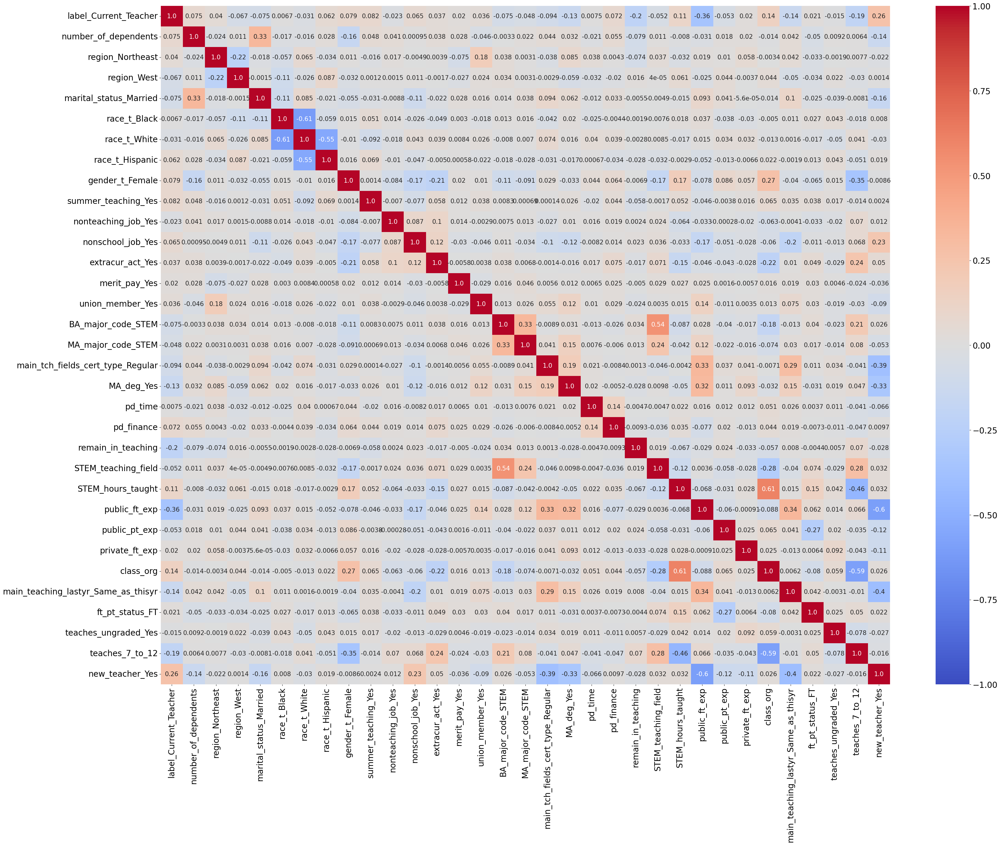

In [64]:
plt.rcParams['axes.titlesize']=18
plt.rcParams['axes.labelsize']=16
plt.rcParams['xtick.labelsize']=20
plt.rcParams['ytick.labelsize']=20

cols_t=['label_Current_Teacher', 'number_of_dependents', 'region_Northeast', 'region_West', 'marital_status_Married', 'race_t_Black', 'race_t_White', 'race_t_Hispanic', 'gender_t_Female', 'summer_teaching_Yes', 'nonteaching_job_Yes', 'nonschool_job_Yes', 'extracur_act_Yes', 'merit_pay_Yes', 'union_member_Yes', 'BA_major_code_STEM', 'MA_major_code_STEM', 'main_tch_fields_cert_type_Regular', 'MA_deg_Yes', 'pd_time', 'pd_finance', 'remain_in_teaching', 'STEM_teaching_field', 'STEM_hours_taught', 'public_ft_exp', 'public_pt_exp', 'private_ft_exp', 'class_org', 'main_teaching_lastyr_Same_as_thisyr', 'ft_pt_status_FT', 'teaches_ungraded_Yes', 'teaches_7_to_12', 'new_teacher_Yes']
corr_t=df_new[cols_t].corr()
plt.figure(figsize=(40,30))
sns.heatmap(data=corr_t, annot=True, annot_kws={"size":15}, fmt=".2", cmap='coolwarm', vmin=-1)
plt.show()

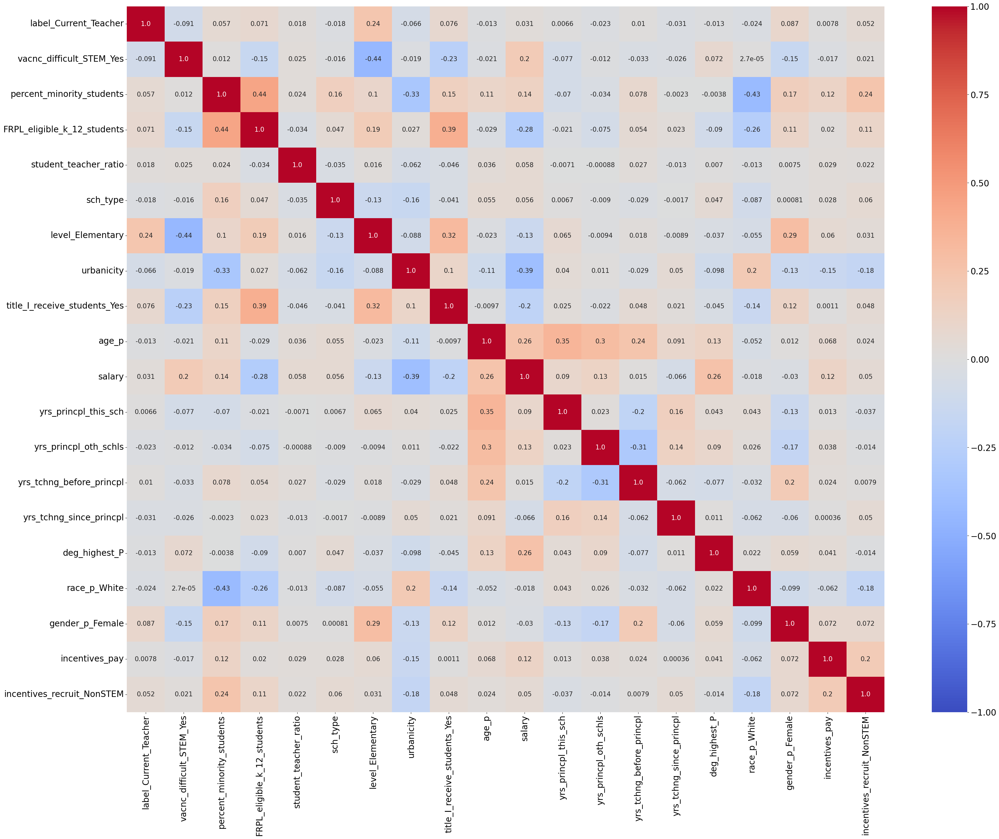

In [65]:
plt.rcParams['axes.titlesize']=18
plt.rcParams['axes.labelsize']=16
plt.rcParams['xtick.labelsize']=20
plt.rcParams['ytick.labelsize']=20

#NEW
cols_sp=['label_Current_Teacher', 'vacnc_difficult_STEM_Yes','percent_minority_students', 'FRPL_eligible_k_12_students', 'student_teacher_ratio', 'sch_type', 'level_Elementary', 'urbanicity', 'title_I_receive_students_Yes', 'age_p', 'salary', 'yrs_princpl_this_sch', 'yrs_princpl_oth_schls', 'yrs_tchng_before_princpl', 'yrs_tchng_since_princpl', 'deg_highest_P', 'race_p_White', 'gender_p_Female', 'incentives_pay', 'incentives_recruit_NonSTEM']

corr_sp=df_new[cols_sp].corr()
plt.figure(figsize=(40,30))
sns.heatmap(data=corr_sp, annot=True, annot_kws={"size":15}, fmt=".2", cmap='coolwarm', vmin=-1)
plt.show()

# Feature Selection - Shrinkage Methods #

Shrinkage Methods using Linear Regression estimate coefficients by adding the penalty terms to the regular loss fucntion. While minimizing the coefficients, the model forces less important features to be reduced towards zero, so that we can understand the importance of selected features.

In this feature selection, 3 models have been used, Lasso and Ridge regression, and ElasticNet for feature interpretation as well as feature importance. It can be obtained by comparing two models, Ridge and Lasso regression, as the latter shrinks features to be exactly zero in contrast to former model. Then, Elastic Net combines both Lasso and Ridge as it reduces the impact of less important features while not eliminating those features.

In [66]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import RidgeClassifierCV
from sklearn.feature_selection import SequentialFeatureSelector

In [67]:
y=df_selected.label_Current_Teacher.values
X=df_selected.drop(['label_Current_Teacher', 'CNTLNUM_T', 'SCHCNTL', 'CNTLNUM_P'], axis=1)

X_train, X_test, y_train, y_test=train_test_split(X.values, y, test_size=0.2, random_state=123, shuffle=True, stratify=y)
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(2912, 53) (728, 53) (2912,) (728,)


**L1 - Lasso Regression**

In [68]:
lr=LogisticRegression(penalty='l1', solver='liblinear', C=0.1)
lr.fit(X_train, y_train)

print('Train Accuracy: {:0.2f}'.format(lr.score(X_train, y_train)))
print('Test Accuracy: {:0.2f}'.format(lr.score(X_test, y_test)))

coef=lr.coef_.flatten()
ft_keep=np.argwhere(np.isin(coef,coef[coef!=0]))
cols=X.columns

df_lr=pd.DataFrame({'feature': cols[ft_keep[:,0]].to_list(), 'coef': coef[coef!=0]*100}, index=range(ft_keep.shape[0]))
df_lr.sort_values(by=['coef'], inplace=True, ignore_index=True, ascending=False)

Train Accuracy: 0.72
Test Accuracy: 0.74


**L2 - Ridge Regression**

In [69]:
rr=LogisticRegression(penalty='l2', solver='liblinear', C=0.1)
rr.fit(X_train, y_train)

print('Train Accuracy: {:0.2f}'.format(rr.score(X_train, y_train)))
print('Test Accuracy: {:0.2f}'.format(rr.score(X_test, y_test)))

coef=rr.coef_.flatten()
ft_keep=np.argwhere(np.isin(coef,coef[coef!=0]))
cols=X.columns

df_rr=pd.DataFrame({'feature': cols[ft_keep[:,0]].to_list(), 'coef': coef[coef!=0]*100}, index=range(ft_keep.shape[0]))
df_rr.sort_values(by=['coef'], inplace=True, ignore_index=True, ascending=False)

Train Accuracy: 0.73
Test Accuracy: 0.74


**L1 & L2 - Elastic Net**

In [70]:
en=LogisticRegression(penalty='elasticnet', solver='saga', C=0.1, l1_ratio=0.5, max_iter=10000)
en.fit(X_train, y_train)

print('Train Accuracy: {:0.2f}'.format(en.score(X_train, y_train)))
print('Test Accuracy: {:0.2f}'.format(en.score(X_test, y_test)))

coef=en.coef_.flatten()
ft_keep=np.argwhere(np.isin(coef,coef[coef!=0]))
cols=X.columns

df_en=pd.DataFrame({'feature': cols[ft_keep[:,0]].to_list(), 'coef': coef[coef!=0]*100}, index=range(ft_keep.shape[0]))
df_en.sort_values(by=['coef'], inplace=True, ignore_index=True, ascending=False)

Train Accuracy: 0.72
Test Accuracy: 0.74


In [71]:
df_lr['model']='Lasso'
df_rr['model']='Ridge'
df_en['model']='ElasticNet'
df_lr['location']=df_lr.feature.map(dic_c)
df_rr['location']=df_rr.feature.map(dic_c)
df_en['location']=df_en.feature.map(dic_c)
df_sh=pd.concat([df_rr, df_lr, df_en], ignore_index=True)
df_loc=df_sh.groupby(['model','location',], as_index=False).agg({'feature': 'count'})

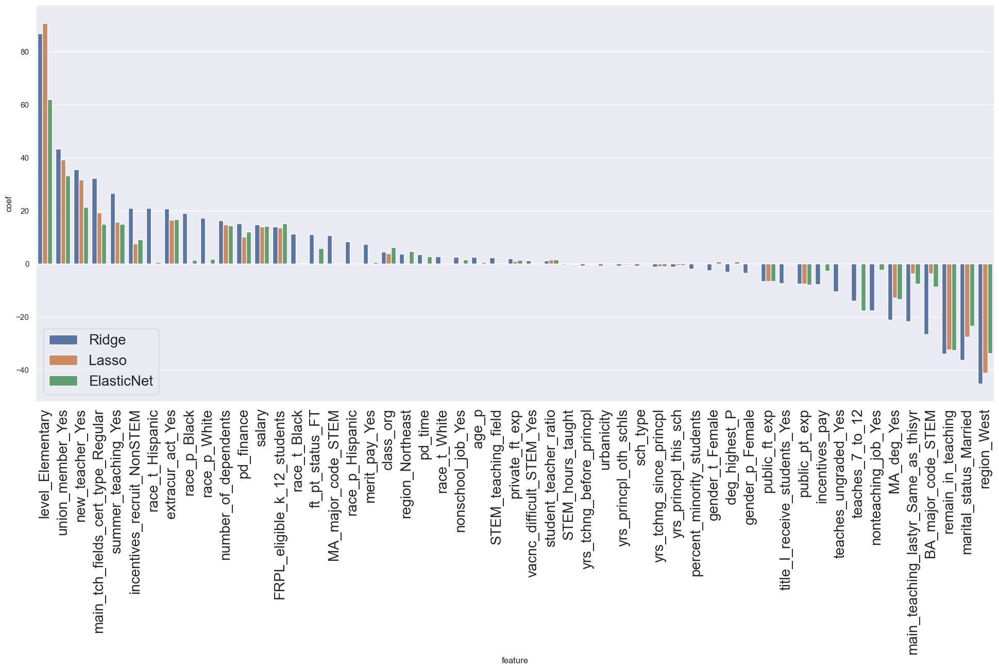

In [72]:
sns.set(rc={'figure.figsize':(24,10)})
ax=sns.barplot(x='feature', y='coef', hue='model', data=df_sh)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90, size=20)
plt.legend(fontsize=20)
plt.show()

In [73]:
df_sh.coef=np.around(df_sh.coef, decimals=2)
df_sh2=df_sh.pivot(index='feature', columns='model', values='coef').sort_values(by=['Ridge', 'Lasso', 'ElasticNet'], ascending=False)
df_sh2=df_sh2.reindex(columns=['Ridge','Lasso','ElasticNet'])

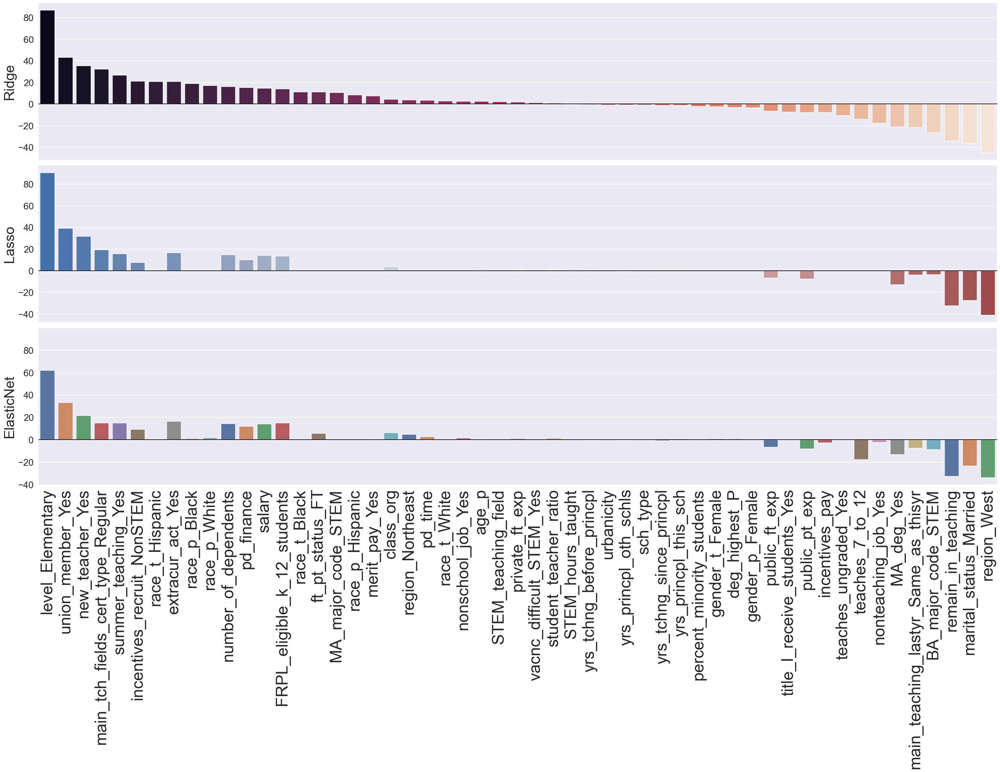

In [74]:
sns.set(rc={'figure.figsize':(30,15)})
f, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(30, 15), sharex=True)

sns.barplot(data=df_sh2, x=df_sh2.index, y='Ridge', palette="rocket", ax=ax1)
ax1.axhline(0, color="k", clip_on=False)
ax1.set_xlabel("")
ax1.set_ylabel('Ridge', fontsize=30)

sns.barplot(data=df_sh2, x=df_sh2.index, y='Lasso', palette="vlag", ax=ax2)
ax2.axhline(0, color="k", clip_on=False)
ax2.set_xlabel("")
ax2.set_ylabel("Lasso", fontsize=30)

sns.barplot(data=df_sh2, x=df_sh2.index, y='ElasticNet', palette="deep", ax=ax3)
ax3.axhline(0, color="k", clip_on=False)
ax3.set_xlabel("")
ax3.set_ylabel("ElasticNet",  fontsize=30)

sns.despine(bottom=True)
# plt.setp(f.axes, yticks=[])
plt.tight_layout(h_pad=1)
# ax1.set_xticklabels(ax1.get_xticklabels(), rotation=90, size=20)
# ax2.set_xticklabels(ax2.get_xticklabels(), rotation=90, size=20)
ax3.set_xticklabels(ax3.get_xticklabels(), rotation=90, size=35)
ax1.set_yticklabels(ax1.get_yticklabels(), size=20)
ax2.set_yticklabels(ax2.get_yticklabels(), size=20)
ax3.set_yticklabels(ax3.get_yticklabels(), size=20)
plt.ylim(-40,100)
plt.show()

Although the importance of the features and their order are not consistent for Lasso, Ridge and Elastic Net shrinkage methods, the top 3, `level_Elementary`, `union_member_Yes`, `new_teacher_Yes`, and the bottom 3, `region_West`, `marital_status_Married`, `remain_in_teaching` features are remained the same. 

In [75]:
df_loc.pivot(index='location', columns='model', values='feature')

model,ElasticNet,Lasso,Ridge
location,,,
"Public Principal, Incentive Policy",11,7,13
Public School,3,3,8
Public Teacher #1,13,6,14
Public Teacher #2,5,4,6
Public Teacher #3,10,8,12


As a result of the shrinkage feature selection method, 31 features have been selected from Lasso, and 47 features selected from ElasticNet among 53 features.

**Rankings of 3 methods features importance**

In [76]:
df_sh2.sort_values(by=['Ridge'], ascending=False)
df_sh2['Ridge_Ranking']=df_sh2.index.to_series().apply(lambda x: np.where(x==df_sh2.index)[0].item(0)+1)
df_sh2.sort_values(by=['Lasso'], ascending=False, inplace=True)
df_sh2['Lasso_Ranking']=df_sh2.index.to_series().apply(lambda x: np.nan if np.where(x==df_sh2.index)[0].item(0)>=df_sh2.shape[0]-df_sh2.Lasso.isna().sum() else str(np.where(x==df_sh2.index)[0].item(0)+1))
df_sh2.sort_values(by=['ElasticNet'], ascending=False, inplace=True)
df_sh2['ElasticNet_Ranking']=df_sh2.index.to_series().apply(lambda x: np.nan if np.where(x==df_sh2.index)[0].item(0)>=df_sh2.shape[0]-df_sh2.ElasticNet.isna().sum() else str(np.where(x==df_sh2.index)[0].item(0)+1))
df_sh2.sort_values(by=['Ridge_Ranking','Lasso_Ranking','ElasticNet_Ranking'], inplace=True)
df_sh2=df_sh2.reindex(columns=['Ridge', 'Ridge_Ranking', 'Lasso', 'Lasso_Ranking', 'ElasticNet', 'ElasticNet_Ranking'])

df_sh2

model,Ridge,Ridge_Ranking,Lasso,Lasso_Ranking,ElasticNet,ElasticNet_Ranking
feature,,,,,,
level_Elementary,86.79,1,90.70,1,61.95,1
union_member_Yes,43.30,2,39.28,2,33.19,2
new_teacher_Yes,35.55,3,31.66,3,21.45,3
main_tch_fields_cert_type_Regular,32.25,4,19.35,4,15.05,6
summer_teaching_Yes,26.65,5,15.81,6,15.04,7
incentives_recruit_NonSTEM,21.10,6,7.60,11,9.23,11
race_t_Hispanic,21.00,7,NaN,NaN,0.70,23
extracur_act_Yes,20.84,8,16.49,5,16.65,4
race_p_Black,19.11,9,NaN,NaN,1.37,19


**Rankings of 3 methods features importance - Absolute**

In [77]:
df_sh3=np.abs(df_sh2[['Ridge', 'Lasso', 'ElasticNet']])
df_sh3.sort_values(by=['Ridge'], ascending=False)
df_sh3['Ridge_Ranking']=df_sh3.index.to_series().apply(lambda x: np.where(x==df_sh3.index)[0].item(0)+1)
df_sh3.sort_values(by=['Lasso'], ascending=False, inplace=True)
df_sh3['Lasso_Ranking']=df_sh3.index.to_series().apply(lambda x: np.nan if np.where(x==df_sh3.index)[0].item(0)>=df_sh3.shape[0]-df_sh3.Lasso.isna().sum() else str(np.where(x==df_sh3.index)[0].item(0)+1))
df_sh3.sort_values(by=['ElasticNet'], ascending=False, inplace=True)
df_sh3['ElasticNet_Ranking']=df_sh3.index.to_series().apply(lambda x: np.nan if np.where(x==df_sh3.index)[0].item(0)>=df_sh3.shape[0]-df_sh3.ElasticNet.isna().sum() else str(np.where(x==df_sh3.index)[0].item(0)+1))
df_sh3.sort_values(by=['Ridge_Ranking','Lasso_Ranking','ElasticNet_Ranking'], inplace=True)
df_sh3=df_sh3.reindex(columns=['Ridge', 'Ridge_Ranking', 'Lasso', 'Lasso_Ranking', 'ElasticNet', 'ElasticNet_Ranking'])

In [78]:
# df_sh2.to_csv('../../data/data_clean/Task2_Feature_Selection_shrinkage_comparison.csv', index=True)

In [79]:
# df_sh3.to_csv('../../data/data_clean/Task2_Feature_Selection_shrinkage_comparison_abs.csv', index=True)

As a result of the comparison of 3 methods, Ridge, Lasso, and ElasticNet, we have 6 candidates to be removed.

`MA_major_code_STEM`, `race_p_Hispanic`, `race_t_White`, `class_org`, `gender_p_Female`, `teaches_ungraded_Yes`.

To analyze and compare the effects of race, gender, and STEM majors after the prediction, only 2 features `class_org`, `teaches_ungraded_Yes` are removed.

In [80]:
cols_ren={'label_Current_Teacher': 'label_Current', 'vacnc_difficult_STEM_Yes': 'vacnc_STEM', 'number_of_dependents': 'num_dependents', 'marital_status_Married': 'married', 'race_t_White': 'race_T_White', 'race_t_Black': 'race_T_Black', 'race_t_Hispanic': 'race_T_Hispanic', 'gender_t_Female': 'gender_T_Female', 'summer_teaching_Yes': 'summer_teaching', 'nonteaching_job_Yes': 'nonteaching_job', 'nonschool_job_Yes': 'nonschool_job', 'extracur_act_Yes': 'extracur_act', 'merit_pay_Yes': 'merit_pay', 'union_member_Yes': 'union_member', 'BA_major_code_STEM': 'BA_major_STEM', 'MA_major_code_STEM': 'MA_major_STEM', 'main_tch_fields_cert_type_Regular': 'field_cert_Regular', 'MA_deg_Yes': 'deg_T_MA', 'remain_in_teaching': 'remain_teaching', 'STEM_teaching_field': 'field_STEM', 'STEM_hours_taught': 'hrs_taught_STEM', 'main_teaching_lastyr_Same_as_thisyr': 'field_same', 'ft_pt_status_FT': 'full_time', 'teaches_7_to_12': 'teaches_7to12', 'new_teacher_Yes': 'new_teacher', 'percent_minority_students': 'minority_students', 'FRPL_eligible_k_12_students': 'FRPL_eligible_k12', 'student_teacher_ratio': 'stu_tch_ratio', 'title_I_receive_students_Yes': 'title_I_receive', 'age_p': 'age_P', 'salary': 'salary_P', 'yrs_princpl_this_sch': 'yrs_P_this_sch', 'yrs_princpl_oth_schls': 'yrs_P_oth_schls', 'yrs_tchng_before_princpl': 'yrs_tch_before_P', 'yrs_tchng_since_princpl': 'yrs_tch_since_P', 'race_p_Black': 'race_P_Black', 'race_p_White': 'race_P_White', 'race_p_Hispanic': 'race_P_Hispanic', 'gender_p_Female': 'gender_P_Female', 'incentives_pay': 'incen_pay', 'incentives_recruit_NonSTEM': 'incen_NonSTEM'}

In [81]:
cols_remove=['class_org', 'teaches_ungraded_Yes']
df_selected.drop(cols_remove, axis=1).rename(columns=cols_ren).to_csv('../../data/data_clean/SASS_cleaned_v3.csv', index=False)

## School Level or Teacher Level Prediction ##

Before going for the next step, prediction, we need to make a decision whether we predict the teacher's retention status on school or teacher level. To help the decision, the questions below are asked:

Q1. Among teachers who responed to 1999-00 SASS, how many of them also participated in 2000-01 TFS?  
Q2. What's maximum number of teachers per school?  


In [82]:
cols_T=['CNTLNUM', 'SCHCNTL', 'SECTOR']
cols_S4A=['CNTLNUM', 'SCHCNTL']

In [83]:
df_T2=pd.read_csv('../../data/SASS_1999-00_TFS_2000-01_v1_0_CSV_Datasets/SASS_99_00_T2_v1_0.csv', sep=',', header=0, usecols=cols_T)
df_T2.rename(columns={'CNTLNUM': 'CNTLNUM_T'}, inplace=True)
df_T2.drop(index=df_T2[df_T2.SECTOR=='B'].index, inplace=True)
df_T2['label']='Former'
df_T3=pd.read_csv('../../data/SASS_1999-00_TFS_2000-01_v1_0_CSV_Datasets/SASS_99_00_T3_v1_0.csv', sep=',', header=0, usecols=cols_T)
df_T3.rename(columns={'CNTLNUM': 'CNTLNUM_T'}, inplace=True)
df_T3.drop(index=df_T3[df_T3.SECTOR=='B'].index, inplace=True)
df_T3['label']='Current'
df_S4A=pd.read_csv('../../data/SASS_1999-00_TFS_2000-01_v1_0_CSV_Datasets/SASS_99_00_S4A_v1_0.csv', sep=',', header=0, usecols=cols_S4A)
df_S4A.rename(columns={'CNTLNUM': 'CNTLNUM_T'}, inplace=True)

In [84]:
print('# of rows from the original data')
print('Public Teachers:', df_S4A.shape[0])
print('TFS - Former Teachers:', df_T2.shape[0])
print('TFS - Current Teachers:', df_T3.shape[0])

# of rows from the original data
Public Teachers: 42086
TFS - Former Teachers: 1679
TFS - Current Teachers: 2477


In [85]:
df_S4A=df_S4A.join(df_T2.set_index(['CNTLNUM_T', 'SCHCNTL']), on=['CNTLNUM_T', 'SCHCNTL'])
df_S4A.reset_index()
df_S4A=df_S4A.join(df_T3.set_index(['CNTLNUM_T', 'SCHCNTL']), on=['CNTLNUM_T', 'SCHCNTL'], lsuffix='', rsuffix='_current')
df_S4A.reset_index()

df_S4A['label']=df_S4A.apply(lambda x: 'Current' if x.label_current=='Current' else x.label, axis=1)
df_S4A.label.fillna('No_Response', inplace=True)
df_S4A.drop(['SECTOR', 'SECTOR_current', 'label_current'], axis=1, inplace=True)

**The number of teachers' responses to TFS**  
Q1. Among teachers who responded to 1999-00 SASS, how many of them also participated in 2000-01 TFS?  

In [86]:
print(df_S4A.label.value_counts())

No_Response    37930
Current         2477
Former          1679
Name: label, dtype: int64


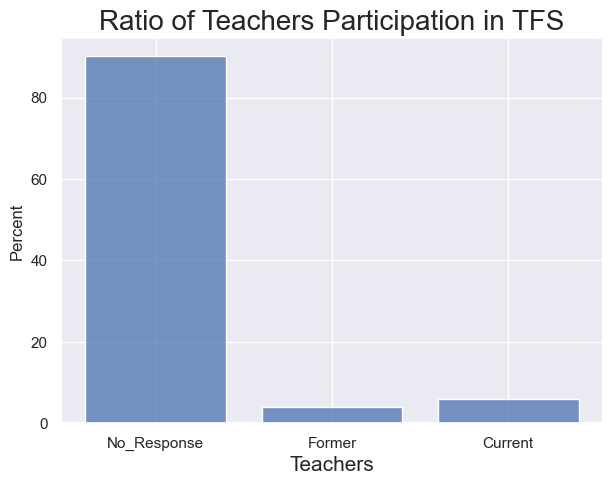

In [87]:
sns.set(rc={'figure.figsize':(7,5)})
sns.histplot(data=df_S4A, x='label', stat='percent', shrink=0.8) #stat='count'
plt.xlabel('Teachers', size=15)
plt.title('Ratio of Teachers Participation in TFS', size=20)
plt.show()

**The number of teachers per school**  
Q2. What's maximum number of teachers per school?  

In [88]:
print('# of rows from the clean data')
print('Public Teachers:', df_selected.CNTLNUM_T.nunique())
print('Public Schools:',df_selected.SCHCNTL.nunique())
print('Public Principals:',df_selected.CNTLNUM_P.nunique())

# of rows from the clean data
Public Teachers: 3640
Public Schools: 2838
Public Principals: 2838


In [89]:
teacher_per_school=df_selected.groupby(['SCHCNTL'], as_index=False).agg({'CNTLNUM_T': 'count', 'label_Current_Teacher': 'sum'})
teacher_per_school.rename(columns={'label_Current_Teacher': 'Current_Teacher'}, inplace=True)
teacher_per_school['Former_Teacher']=teacher_per_school.apply(lambda x: x.CNTLNUM_T-x.Current_Teacher, axis=1)
teacher_per_school.rename(columns={'CNTLNUM_T': 'Teachers Per School'}).describe()

,SCHCNTL,Teachers Per School,Current_Teacher,Former_Teacher
count,2838.000000,2838.000000,2838.000000,2838.000000
mean,106255.994715,1.282593,0.766737,0.515856
std,3545.953449,0.566159,0.689204,0.608594
min,100013.000000,1.000000,0.000000,0.000000
25%,103180.500000,1.000000,0.000000,0.000000
50%,106313.000000,1.000000,1.000000,0.000000
75%,109310.250000,1.000000,1.000000,1.000000
max,112324.000000,6.000000,6.000000,4.000000


In [90]:
teacher_per_school2=teacher_per_school.groupby(['CNTLNUM_T'], as_index=False).agg({'SCHCNTL': 'count', 'Current_Teacher': 'sum', 'Former_Teacher': 'sum'})
num_teachers=pd.DataFrame(teacher_per_school2[['Current_Teacher','Former_Teacher']].stack(), columns=['Num_Teachers'])#, index=range(teacher_per_school2.shape[0]*2))
teacher_per_school2.rename(columns={'CNTLNUM_T': 'Teachers Per School', 'SCHCNTL': 'Num_Schools'})

,Teachers Per School,Num_Schools,Current_Teacher,Former_Teacher
0,1,2173,1266,907
1,2,553,679,427
2,3,91,171,102
3,4,18,49,23
4,5,2,5,5
5,6,1,6,0


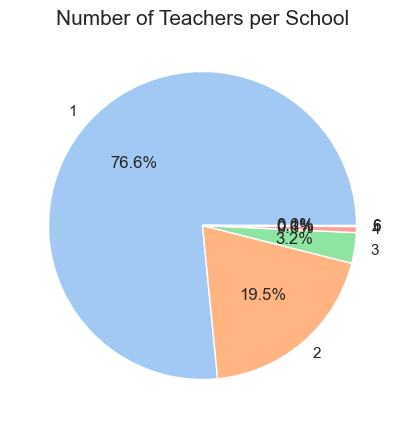

In [91]:
plt.figure(figsize=(7,5))

size=1
colors=sns.color_palette('pastel')[:teacher_per_school.CNTLNUM_T.value_counts().index.nunique()]
plt.pie(teacher_per_school2.SCHCNTL, labels=teacher_per_school2.CNTLNUM_T, colors=colors, radius=1, autopct='%1.1f%%', wedgeprops=dict(width=size, edgecolor='w'))
# colors=sns.color_palette('deep')[0:2]
# plt.pie(num_teachers.Num_Teachers, labels=num_teachers.index.to_frame()[1].values, colors=colors, radius=1-size, autopct='%1.1f%%', wedgeprops=dict(width=0.3, edgecolor='w'))
plt.title('Number of Teachers per School', size=15)

plt.show()

As the majority of schools has only 1 teacher who participated in the TFS, the prediction will be done on the teacher-level.